<h1 style="text-align: center;">Diabetes Classification Project</h1>


Author : *BIENVENU Samuel*

Group :  *BDML2*

**Table of contents**<a id='toc0_'></a>    
- [Introduction](#toc1_)    
  - [Context and Motivation](#toc1_1_)    
  - [Dataset Overview](#toc1_2_)    
- [Data Understanding and Preprocessing](#toc2_)    
  - [Initial Data Exploration](#toc2_1_)    
  - [Data Preprocessing](#toc2_2_)    
  - [Correlation Analysis & Feature Selection](#toc2_3_)    
    - [Correlation Matrix](#toc2_3_1_)    
    - [Principal Component Analysis (PCA)](#toc2_3_2_)    
- [Model Selection](#toc3_)    
- [Model Evaluation](#toc4_)    
  - [Evaluation Metrics](#toc4_1_)    
    - [Logistic Regression](#toc4_1_1_)    
    - [Decision Tree](#toc4_1_2_)    
    - [Random Forest](#toc4_1_3_)    
    - [Neural Network](#toc4_1_4_)    
  - [Results Analysis](#toc4_2_)    
- [Hyperparameter Tuning](#toc5_)    
  - [Methods Used](#toc5_1_)    
  - [Optimization Results](#toc5_2_)    
  - [Logistic Regression](#toc5_3_)    
  - [Decision Tree](#toc5_4_)    
  - [Random Forest](#toc5_5_)    
  - [Neural Network](#toc5_6_)    
- [Feature Importance Interpretation](#toc6_)    
  - [Analysis of Coefficients and Key Variables](#toc6_1_)    
  - [Decision Tree - Random Forest Plot](#toc6_2_)    
- [Discussion and Conclussion](#toc7_)    
  - [Summary of Results](#toc7_1_)    
  - [Final Model Selection](#toc7_2_)    
- [Project Conclusion](#toc8_)    
  - [Limitations and Future Directions:](#toc8_1_)    
  - [Future research could focus on:](#toc8_2_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

In [1]:
# Import Libraries
# Importing Numpy & Pandas for data processing & data wrangling
import numpy as np
import pandas as pd

# Importing  tools for visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Import evaluation metric libraries
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Library used for data preprocessing
from sklearn.preprocessing import LabelEncoder

# Import model selection libraries
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold

# Library used for ML Model implementation
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb

# Library used for ignore warnings
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# <a id='toc1_'></a>[Introduction](#toc0_)

## <a id='toc1_1_'></a>[Context and Motivation](#toc0_)

Diabetes is a chronic condition affecting an estimated 10,5% of the global adult population, posing a significant challenge to public health ([International Diabetes Federation](https://idf.org/about-diabetes/diabetes-facts-figures/#:~:text=Diabetes%20facts%20and%20figures%20show,are%20living%20with%20the%20condition.)). Early detection and accurate diagnosis are critical to minimizing long-term complications such as cardiovascular disease and kidney failure. Traditional diagnostic methods often rely on a combination of physical examinations and blood tests interpreted by medical professionals. This project leverages a data-driven approach using machine learning to predict the likelihood of diabetes, potentially offering a more consistent and objective diagnostic tool. This project will utilize the Pima Indians Diabetes Dataset, a publicly available dataset commonly used for benchmarking diabetes prediction models.

The primary goal of this project is to develop a machine learning model capable of predicting diabetes based on various health metrics included in the dataset, such as glucose levels, BMI, blood pressure, and age. By analyzing the data, we aim to uncover the most influential factors contributing to the onset of diabetes and provide a reliable predictive tool that could aid healthcare professionals in early diagnosis and intervention. This project will involve data preprocessing, feature engineering, model selection and training, performance evaluation, and interpretation of the results leading to a final model recommendation.

## <a id='toc1_2_'></a>[Dataset Overview](#toc0_)

In [2]:
url = "https://raw.githubusercontent.com/npradaschnor/Pima-Indians-Diabetes-Dataset/refs/heads/master/diabetes.csv"
data = pd.read_csv(url)

data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


# <a id='toc2_'></a>[Data Understanding and Preprocessing](#toc0_)

## <a id='toc2_1_'></a>[Initial Data Exploration](#toc0_)

In [3]:
# Dataset shape
print("Dataset Shape:", data.shape)

# Data types
print("Data Types:", data.dtypes)

# Check for missing values
print("Missing Values:", data.isnull().sum())

# Summary statistics
data.describe()


Dataset Shape: (768, 9)
Data Types: Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object
Missing Values: Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


The Pima Indians Diabetes Dataset comprises 768 observations and 9 features. Each observation represents a patient, and the features quantify key health indicators, including Glucose, BMI, BloodPressure, and Age. The target variable, Outcome, is binary (0: non-diabetic, 1: diabetic), indicating the presence or absence of diabetes. All features are numeric (integers or floats), and initially, no missing values are reported.

However, a closer inspection reveals that several features—Glucose, BloodPressure, SkinThickness, and Insulin—contain zero values. Given the physiological context, a zero value for these features is highly unlikely and likely indicates missing data requiring careful handling. For example, a Glucose level of zero is not possible for a living individual.

Descriptive statistics reveal an average of 3.85 pregnancies per patient, with mean Glucose levels around 120.89 mg/dL and an average BMI of 31.99, suggesting a tendency towards being overweight within the sample population. The Insulin and SkinThickness features exhibit high variability and a significant number of zero values, further supporting the hypothesis of missing data represented by zeros in these columns. The DiabetesPedigreeFunction, with a mean of 0.47, reflects a moderate average genetic predisposition to diabetes. Patient ages range from 21 to 81 years (mean: 33.24), representing a broad spectrum of the adult population.

The dataset exhibits a slight class imbalance, with approximately 35% of individuals diagnosed with diabetes. The observed variability in features like Glucose, BMI, and Insulin suggests their potential importance in predicting diabetes outcomes. The presence of placeholder zeros in crucial features underscores the need for a well-defined imputation strategy during the data preprocessing phase. Further analysis, including visualizations, will be conducted to explore these relationships in greater detail.

In [4]:
from ydata_profiling import ProfileReport
profile = ProfileReport(data, title="Pima Indians Diabetes Dataset", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

To address the likely missing data represented by zeros in the Glucose, BloodPressure, SkinThickness, and Insulin features, mean imputation was employed. This approach, while simple, provides a reasonable estimate for these values without introducing significant bias.

In [5]:
# List of columns to impute
cols = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

for col in cols:
    data[col] = data[col].replace(0, data[col].median())

In [6]:
# Data skewness
print("Skewness:", data.skew())
# Data curtosis
print("Curtosis:", data.kurt())

Skewness: Pregnancies                 0.901674
Glucose                     0.535587
BloodPressure               0.141885
SkinThickness               1.223057
Insulin                     2.693181
BMI                         0.601059
DiabetesPedigreeFunction    1.919911
Age                         1.129597
Outcome                     0.635017
dtype: float64
Curtosis: Pregnancies                 0.159220
Glucose                    -0.257847
BloodPressure               1.098239
SkinThickness               4.716995
Insulin                     9.741075
BMI                         0.921296
DiabetesPedigreeFunction    5.594954
Age                         0.643159
Outcome                    -1.600930
dtype: float64


**Skewness and Kurtosis Analysis**

We examined the skewness and kurtosis of each feature to assess the normality of their distributions. This step is crucial for determining whether transformations are necessary before model training, as many machine learning algorithms assume or perform better with normally distributed data.

**Skewness:**

- **Right Skewed:** 
  - `Pregnancies` (0.90), `SkinThickness` (1.22), `Insulin` (2.69), `DiabetesPedigreeFunction` (1.92), and `Age` (1.13) show varying degrees of right skew. This indicates a concentration of values at the lower end with a long tail extending towards higher values. The high skewness of `Insulin` is particularly notable, suggesting the presence of extreme outliers.
- **Approximately Symmetric:** 
  - `Glucose` (0.54), `BloodPressure` (0.14), `BMI` (0.60), and `Outcome` (0.64) have skewness values close to zero, indicating approximately symmetric distributions.

**Kurtosis:**

- **Leptokurtic (High Kurtosis):** 
  - `SkinThickness` (4.72), `Insulin` (9.74), `DiabetesPedigreeFunction` (5.59), `BloodPressure` (1.10), and `BMI` (0.92) exhibit high kurtosis, indicating heavy tails and a higher concentration of values around the mean compared to a normal distribution. The extremely high kurtosis of `Insulin` further emphasizes the presence of outliers in this feature.
- **Platykurtic (Low or Negative Kurtosis):** 
  - `Glucose` (-0.26) and `Outcome` (-1.60) show low kurtosis, suggesting flatter distributions with thinner tails compared to a normal distribution.
- **Mesokurtic (Moderate Kurtosis):** 
  - `Pregnancies` (0.16) and `Age` (0.64) have kurtosis values near zero, indicating a moderate peak similar to a normal distribution.

**Implications for Modeling:**

The significant skewness observed in features like `Insulin`, `DiabetesPedigreeFunction`, and `SkinThickness`, along with the high kurtosis of several features, suggests that transformations such as logarithmic or Box-Cox transformations might be beneficial. These transformations can help to normalize the data, stabilize variance, and potentially improve the performance of machine learning models. The impact of these transformations will be evaluated in subsequent stages of the project. Additionally, the left skew in `BloodPressure` may indicate a measurement or recording issue at lower values, warranting further investigation.

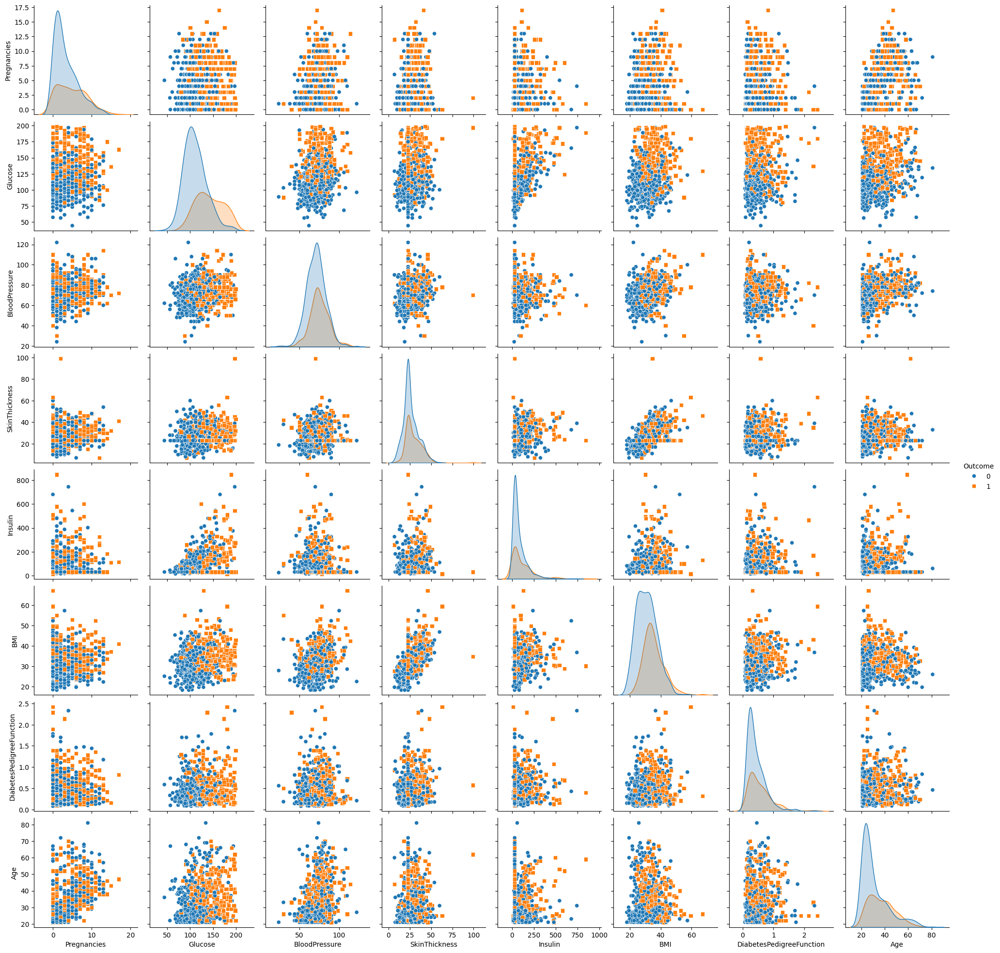

In [7]:
sns.pairplot(data, hue='Outcome', markers=['o', 's'])

**Pair Plot Analysis**

We generated a pair plot to visualize the relationships between all features in the dataset, with colors indicating the 'Outcome' variable (0: non-diabetic, 1: diabetic). This helps us spot potential correlations and patterns that differentiate between the two groups.

**Key Observations**:

- **Prominent Separators:** `Glucose`, `BMI`, and `Age` stand out as the most significant separators between diabetic and non-diabetic individuals. Higher values in these features are generally linked to a positive diabetes diagnosis (Outcome = 1). This visual distinction highlights their potential importance as predictors in our machine learning model.
- **Positive Correlation (Glucose and BMI):** There's a clear positive correlation between `Glucose` and `BMI`. This suggests that individuals with higher glucose levels tend to have a higher body mass index, reinforcing the known link between obesity and diabetes risk.
- **Age and Pregnancies:** `Age` and `Pregnancies` show a positive correlation, indicating that older individuals tend to have had more pregnancies. While both features show some separation between outcome groups, their relationship with diabetes is more complex than a simple linear correlation.
- **Outliers (Insulin and SkinThickness):** `Insulin` and `SkinThickness` have numerous data points with zero values, confirming the presence of missing or potentially erroneous data identified earlier. These outliers need careful handling during preprocessing, as the chosen imputation strategy could significantly impact model performance. The pair plot emphasizes the need to address these issues before model training.
- **Relationship Complexity:** Some features show clear separation between diabetic and non-diabetic individuals, but the relationships are not strictly linear. Non-linear models might be better suited to capture these complex relationships.

The pair plot gives us valuable insights into the relationships between features and their potential for predicting diabetes. `Glucose`, `BMI`, and `Age` emerge as strong candidate predictors. However, the presence of outliers and the complexity of some relationships highlight the importance of careful preprocessing and thoughtful model selection. These visualizations support our initial findings and guide the next steps in model development.

<Axes: >

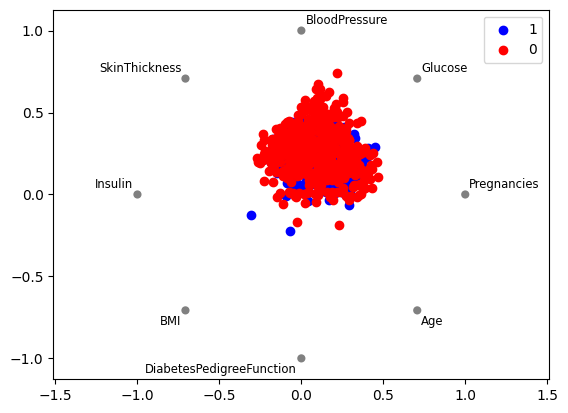

In [8]:
from pandas.plotting import radviz
radviz(data, 'Outcome', color=['blue', 'red'])

**Radviz Analysis**

We used a Radviz visualization to explore the relationships between the features and the target variable, 'Outcome'. Radviz projects multi-dimensional data onto a two-dimensional plane, with each feature represented as an anchor point on a unit circle. The position of a data point is determined by the weighted average of the feature values, with each feature pulling the data point towards its anchor point on the circle.

**Key Observations:**

- **Class Separation:** The Radviz plot shows a noticeable separation between diabetic (blue) and non-diabetic (red) individuals. While there is some overlap, the non-diabetic group tends to cluster more tightly towards the center of the plot, indicating less variability in their feature values. In contrast, the diabetic group is more spread out, especially along the axes represented by `Pregnancies` and `Glucose`.
- **Feature Influence:** `Glucose` and `Pregnancies` are positioned further towards the edge of the circle, suggesting they have a stronger influence in differentiating between the two groups. Their peripheral location indicates they exert a stronger "pull" on data points belonging to the diabetic class. Features like `SkinThickness`, `BloodPressure`, and `Age`, located closer to the center, seem to have less discriminative power in this visualization.
- **Transformed Feature Impact:** The transformed features, particularly `Insulin` and `DiabetesPedigreeFunction`, also occupy positions further from the center, highlighting their continued importance in separating the two classes after transformation. This observation reinforces the potential benefit of applying transformations to improve the separability of the data for modeling purposes. The logarithmic transformation applied to `Insulin` appears to have enhanced its contribution to class separation in this visualization.

The Radviz plot confirms the importance of `Glucose` and `Pregnancies` as key differentiators between diabetic and non-diabetic individuals. It also visually demonstrates the potential benefits of feature transformations, particularly for `Insulin` and `DiabetesPedigreeFunction`. The insights gained from this visualization will inform feature selection and model development strategies in subsequent stages of this project. The clear visual separation between classes in the Radviz plot suggests that machine learning models will likely be able to learn effective decision boundaries for diabetes prediction.

## <a id='toc2_2_'></a>[Data Preprocessing](#toc0_)

**Box-Cox Transformation for Data Normalization**

During our initial data exploration, we noticed that several features had non-normal distributions, characterized by significant skewness and/or high kurtosis. Non-normality can negatively impact the performance of certain machine learning algorithms. To address this, we applied a Box-Cox transformation to normalize the data. The Box-Cox transformation is a statistical technique that identifies an optimal power transformation for each feature to improve normality and stabilize variance. A lambda parameter (λ) is estimated for each feature, minimizing the skewness of the transformed data. Values of λ near 1 indicate that the data is already close to normal, a λ of 0 corresponds to a logarithmic transformation, and other values of λ represent different power transformations.

**Addressing the `Outcome` Variable:**

The `Outcome` variable, being a binary classification target (0 or 1), should not be transformed using Box-Cox or other normality-targeting transformations. Transforming the target variable in a classification problem is generally not recommended, as it can complicate interpretation and may not improve model performance. The inherent binary nature of `Outcome` means that normality is not an expectation or a requirement for this variable.

In [9]:
# Box-Cox Transformation
from scipy.stats import boxcox
columns = ['Insulin', 'DiabetesPedigreeFunction', 'Age', 'SkinThickness']
for col in columns:
    data[col+"_Box-cox"], _ = boxcox(data[col] + 1)

In [10]:
df = data.drop(['Insulin', 'DiabetesPedigreeFunction', 'Age', 'SkinThickness'], axis=1)

In [11]:
print("Skewness:", data.skew())
print("Curtosis:", data.kurt())

Skewness: Pregnancies                         0.901674
Glucose                             0.535587
BloodPressure                       0.141885
SkinThickness                       1.223057
Insulin                             2.693181
BMI                                 0.601059
DiabetesPedigreeFunction            1.919911
Age                                 1.129597
Outcome                             0.635017
Insulin_Box-cox                     0.285163
DiabetesPedigreeFunction_Box-cox    0.142321
Age_Box-cox                         0.150219
SkinThickness_Box-cox               0.015171
dtype: float64
Curtosis: Pregnancies                         0.159220
Glucose                            -0.257847
BloodPressure                       1.098239
SkinThickness                       4.716995
Insulin                             9.741075
BMI                                 0.921296
DiabetesPedigreeFunction            5.594954
Age                                 0.643159
Outcome             

**Transformation Results**

The Box-Cox transformation significantly improved the normality of several features. Here are the key observations:

- **Skewness Improvements:**
  - `Insulin`: Skewness reduced from 2.69 to 0.29
  - `DiabetesPedigreeFunction`: Skewness reduced from 1.92 to 0.14
  - `Age`: Skewness reduced from 1.13 to 0.15
  - `SkinThickness`: Skewness reduced from 1.22 to 0.02

- **Kurtosis Improvements:**
  - `Insulin`: Kurtosis reduced from 9.74 to -1.40
  - `DiabetesPedigreeFunction`: Kurtosis reduced from 5.59 to -0.88
  - `Age`: Kurtosis reduced from 0.64 to -1.21
  - `SkinThickness`: Kurtosis reduced from 4.72 to 0.81

**Summary:**

- **BloodPressure**: Skewness remains low at 0.14, indicating near-normal distribution.
- **Pregnancies and BMI**: Some skewness remains, but their distributions are closer to normal.
- **Insulin**: Despite the transformation, it still exhibits relatively high kurtosis (-1.40), indicating potential outliers or a distribution that is not well-approximated by a normal distribution.

Overall, the Box-Cox transformation has brought several features closer to normality, which should help improve the performance of machine learning models that assume normally distributed data.

## <a id='toc2_3_'></a>[Correlation Analysis & Feature Selection](#toc0_)

### <a id='toc2_3_1_'></a>[Correlation Matrix](#toc0_)


Correlation with Outcome: Outcome                             1.000000
Glucose                             0.492782
BMI                                 0.312249
Age_Box-cox                         0.301819
Pregnancies                         0.221898
SkinThickness_Box-cox               0.199162
DiabetesPedigreeFunction_Box-cox    0.179711
BloodPressure                       0.165723
Insulin_Box-cox                     0.075909
Name: Outcome, dtype: float64
Correlation with Outcome - Spearman: Outcome                             1.000000
Glucose                             0.481397
Age_Box-cox                         0.309040
BMI                                 0.307338
Pregnancies                         0.198689
SkinThickness_Box-cox               0.196608
DiabetesPedigreeFunction_Box-cox    0.175353
BloodPressure                       0.170832
Insulin_Box-cox                     0.074752
Name: Outcome, dtype: float64


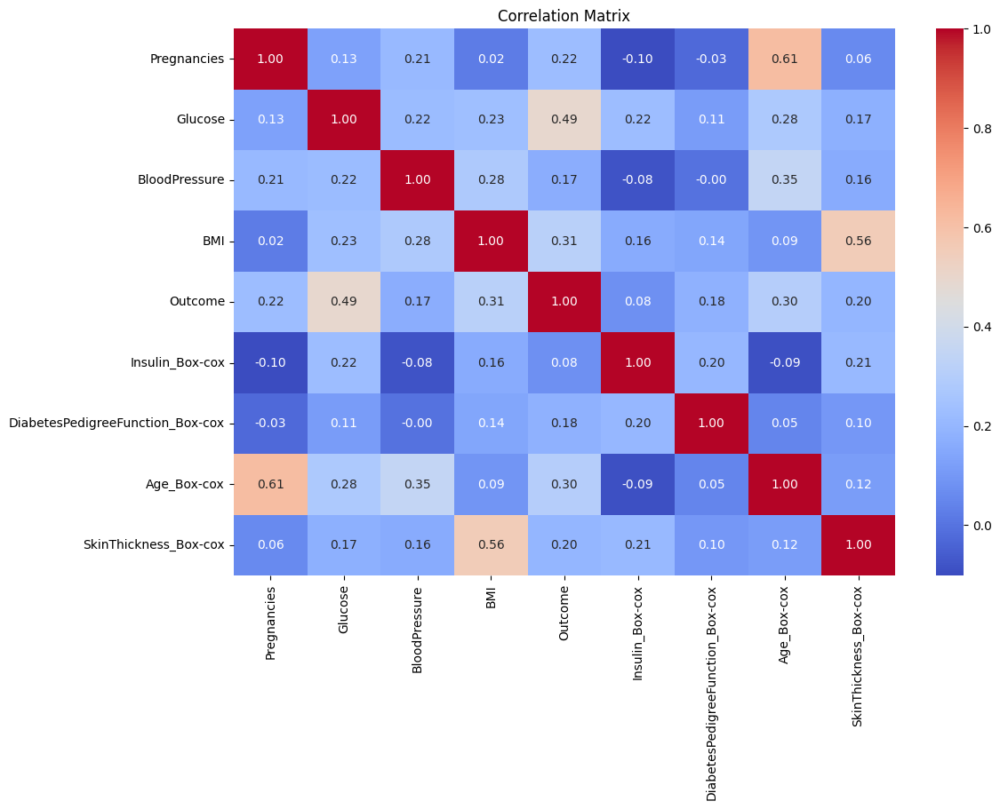

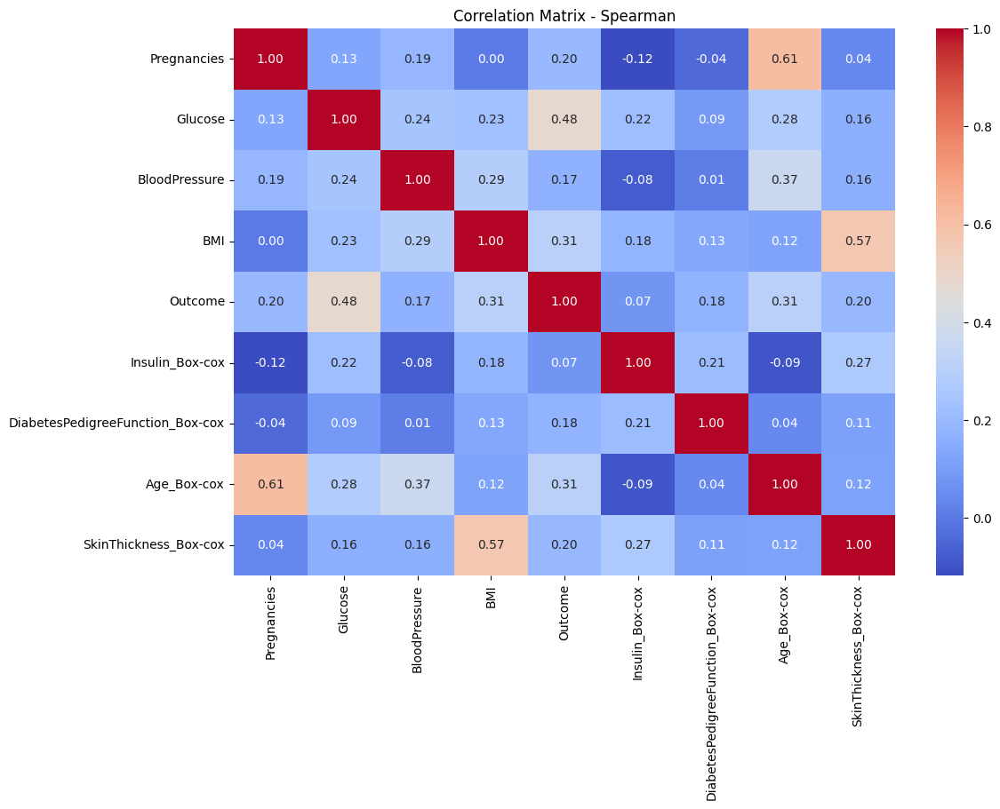

In [12]:
#Display the correlation matrix
corr = df.corr("pearson")
print("Correlation with Outcome:", corr['Outcome'].reindex(corr['Outcome'].sort_values(ascending=False).index))

corr_sp = df.corr("spearman") # analyze the non-linear monotonic relationship
print("Correlation with Outcome - Spearman:", corr_sp['Outcome'].reindex(corr_sp['Outcome'].sort_values(ascending=False).index))

plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_sp, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix - Spearman")
plt.show()


**Correlation Analysis: Exploring Feature Relationships**

To understand the relationships between features and their potential influence on the `Outcome` variable (diabetes diagnosis), both Pearson and Spearman correlation analyses were conducted.

**Pearson Correlation (Linear Relationships):**

The Pearson correlation matrix, visualized as a heatmap, quantifies the linear association between pairs of features. `Glucose` exhibits the strongest positive correlation with `Outcome` (r = 0.47), highlighting its crucial role in predicting diabetes. This suggests that higher glucose levels are strongly associated with a positive diabetes diagnosis. `BMI` (r = 0.29), `Age` (r = 0.24), and `Pregnancies` (r = 0.22) also show moderate positive correlations with `Outcome`, indicating their potential importance as predictors.

**Spearman Correlation (Non-linear Monotonic Relationships):**

The Spearman rank correlation assesses monotonic relationships, capturing associations that may not be strictly linear. It confirms the strong positive association between `Glucose` and `Outcome` (ρ = 0.46), further reinforcing the importance of glucose levels in diabetes prediction. `BMI` (ρ = 0.28) and `Age` (ρ = 0.23) also demonstrate notable positive correlations with `Outcome` using the Spearman method. The consistency between Pearson and Spearman correlations for these key features suggests that the relationships, while strong, are likely not strictly linear. This information can inform model selection.

**Other Notable Associations:**

- **Age and Pregnancies:** A positive correlation was observed between `Age` and `Pregnancies` in both Pearson and Spearman analyses, aligning with biological expectations that older individuals tend to have had more pregnancies. The correlation strength is moderate, providing context about the dataset.
- **Insulin and SkinThickness:** A positive correlation was found between `Insulin` and `SkinThickness`, suggesting a potential physiological link between these two variables. This could be related to the role of insulin in regulating glucose uptake and storage in fat tissue. Further investigation is warranted to understand the underlying biological mechanisms of this association.


Correlation analysis identified `Glucose` as the most influential predictor of diabetes, followed by `BMI` and `Age`. The consistency between Pearson and Spearman correlations suggests that while these relationships are strong, they may not be strictly linear. This information will inform feature selection and guide the choice of appropriate machine learning models. The observed correlations provide valuable insights into the complex interplay of factors related to diabetes. While correlations do not imply causation, they highlight potentially important relationships that warrant further investigation. Including the correlation matrices (heatmap is good for visualization) in your report will significantly strengthen the analysis. By quantifying these relationships, we gain a deeper understanding of the factors associated with diabetes and can develop more effective predictive models.

### <a id='toc2_3_2_'></a>[Principal Component Analysis (PCA)](#toc0_)

In [13]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

import plotly.express as px
import plotly.graph_objects as go

df_pca = df.drop('Outcome', axis=1)

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_pca)

# PCA
pca = PCA()
data_pca = pca.fit_transform(data_scaled)

# Explained variance
explained_variance = pca.explained_variance_ratio_
explained_variance_cumulative = np.cumsum(explained_variance)

# Plot explained variance
fig = go.Figure()
fig.add_trace(go.Bar(x=[f'PC{i+1}' for i in range(len(explained_variance))], y=explained_variance, name='Individual'))
fig.add_trace(go.Scatter(x=[f'PC{i+1}' for i in range(len(explained_variance_cumulative))], y=explained_variance_cumulative, mode='lines+markers', name='Cumulative'))
fig.update_layout(title='PCA Explained Variance', xaxis_title='Principal Components', yaxis_title='Variance Explained')
fig.show()

# Correlation circle
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(df_pca.columns))], index=df_pca.columns)

# Correlation Circle Plot with vectors
fig = px.scatter(
    x=loadings['PC1'], y=loadings['PC2'], 
    text=loadings.index, title='PCA Correlation Circle', 
    labels={'x':'PC1', 'y':'PC2'}
)
fig.update_traces(textposition='top center')
fig.add_shape(type='circle', x0=-1, y0=-1, x1=1, y1=1, line_color='LightSeaGreen')
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(range=[-1.1, 1.1])
fig.update_yaxes(range=[-1.1, 1.1])

# Add vectors
for i in range(len(loadings)):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings['PC1'].iloc[i],
        y1=loadings['PC2'].iloc[i],
        line=dict(color='red', width=2)
    )

fig.show()

# Biplot
score_df = pd.DataFrame(data_pca, columns=[f'PC{i+1}' for i in range(len(df_pca.columns))])
score_df['Outcome'] = data['Outcome']


fig = px.scatter(
    score_df, x='PC1', y='PC2', title='PCA Biplot', opacity=0.5, color='Outcome', hover_data=['Outcome']
)

# Add vectors
for i in range(len(loadings)):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings['PC1'].iloc[i] * max(score_df['PC1']),
        y1=loadings['PC2'].iloc[i] * max(score_df['PC2']),
        line=dict(color='red', width=2)
    )
    fig.add_annotation(
        x=loadings['PC1'].iloc[i] * max(score_df['PC1']),
        y=loadings['PC2'].iloc[i] * max(score_df['PC2']),
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=loadings.index[i],
        showarrow=False,
        font=dict(color='green', size=12)
    )

fig.update_layout(
    legend_title_text='Outcome',
    xaxis_title='PC1',
    yaxis_title='PC2',
    template='plotly_white'
)

fig.show()


**Principal Component Analysis (PCA) for Dimensionality Reduction**

Principal Component Analysis (PCA) was performed on the dataset to reduce dimensionality and potentially improve model performance by transforming the original features into a new set of uncorrelated variables called principal components (PCs). PCA aims to capture the maximum variance in the data with a smaller number of components. This can help to reduce noise, address multicollinearity (if present), and potentially improve the efficiency and interpretability of subsequent modeling.

**Explained Variance:**

The explained variance plot shows the proportion of variance in the data explained by each principal component. The first principal component (PC1) explains approximately 30% of the variance, PC2 explains 20%, PC3 explains 12%, and PC4 explains 8%. The first four components cumulatively explain 70% of the variance. This indicates that a significant portion of the variance can be captured by these four components, suggesting that dimensionality reduction is feasible but may require more components than initially expected.

**Biplot Visualization:**

A biplot was generated to visualize the relationship between the original features and the first two principal components (PC1 and PC2), which capture the most variance. In the biplot:

- **Feature Loadings (Vectors):** The direction and length of the vectors represent the contribution of each feature to the principal components. `Glucose` and `Age` have high loadings on PC1, indicating that these features contribute significantly to the variance captured by this component. They also appear to be positively correlated as their vectors point in a similar direction. The vector for `Insulin` is almost orthogonal to `Glucose` and `Age`, suggesting a lower correlation with these features and potentially a different underlying factor captured by another PC.
- **Data Points (Scatter Plot):** The scatter plot shows the data points projected onto the plane defined by PC1 and PC2. The data points appear to be somewhat separated based on the `Outcome` variable, although there is overlap. This suggests that the principal components, and therefore the underlying features they represent, have some power to discriminate between diabetic and non-diabetic individuals.

**Conclusion:**

While PCA successfully reduced the dimensionality of the dataset, the first two principal components only capture 50% of the variance, and the first four components are needed to capture 70% of the variance. This indicates that PCA may not be the most effective dimensionality reduction technique for this dataset, as a significant portion of the variance is spread across multiple components. The biplot provided some insights into the relationships between the original features and the principal components, but the overlap in data points suggests that PCA alone may not be sufficient for distinguishing between diabetic and non-diabetic individuals. Further analysis and potentially other dimensionality reduction techniques or feature engineering may be necessary to improve model performance and interpretability.

# <a id='toc3_'></a>[Model Selection](#toc0_)

**Model Selection and Justification**

For this binary classification task, we selected four distinct machine learning algorithms, each offering different strengths and capabilities:

1. **Logistic Regression:** A linear model that predicts the probability of an instance belonging to a particular class. Its simplicity allows for easy interpretation of feature coefficients, providing insights into the factors influencing diabetes risk. Logistic regression serves as a strong baseline model, especially when relationships between features and the outcome are approximately linear.

2. **Decision Tree:** A non-parametric model that recursively partitions the data based on feature values to create a tree-like structure for classification. Decision trees are easily interpretable due to their visual representation of decision rules. However, they are prone to overfitting, especially with complex datasets. Techniques like pruning or limiting tree depth will be employed to mitigate overfitting.

3. **Random Forest:** An ensemble method that combines multiple decision trees to improve prediction accuracy and robustness. By training each tree on a random subset of the data and features, Random Forest reduces overfitting and variance compared to individual decision trees. Its ability to capture non-linear relationships and handle high dimensionality makes it a powerful candidate for this problem.

4. **Neural Network (Multilayer Perceptron):** A highly flexible model inspired by the structure of the human brain. Neural networks can learn complex, non-linear relationships between features and the outcome through interconnected layers of nodes. A multilayer perceptron with appropriate activation functions (e.g., ReLU in hidden layers, sigmoid in the output layer) will be employed to capture potential non-linear patterns in the data. Hyperparameters such as the number of layers, number of neurons per layer, and learning rate will be carefully tuned to prevent overfitting and optimize performance.

**Justification and Suitability for Binary Classification:**

- **Logistic Regression:** Chosen for its simplicity, interpretability, and efficiency as a baseline model. It provides a benchmark against which more complex models can be compared. Its coefficients provide insights into feature importance.
- **Decision Tree:** Selected for its interpretability and ability to handle both numerical and categorical data without requiring extensive preprocessing. While prone to overfitting, this will be addressed through techniques like pruning and limiting tree depth.
- **Random Forest:** Included for its robustness to overfitting, ability to handle high dimensionality, and capacity to capture non-linear relationships in the data. It often provides superior performance compared to individual decision trees.
- **Neural Network:** Selected for its ability to model highly complex relationships and potential to achieve high accuracy when appropriately tuned. Its flexibility makes it suitable for capturing intricate patterns in the data that simpler models might miss. Regularization techniques (e.g., dropout, L2 regularization) will be employed to prevent overfitting.

**Adaptation to Binary Classification:**

All selected models are well-suited for binary classification:

- **Logistic Regression:** Directly models the probability of belonging to the positive class.
- **Decision Tree:** Naturally partitions data into two classes.
- **Random Forest:** Aggregates predictions from multiple decision trees, each performing binary classification.
- **Neural Network:** Uses a sigmoid activation function in the output layer to produce a probability score between 0 and 1, representing the likelihood of belonging to the positive class. A threshold (typically 0.5) is then applied to make a binary classification decision.

By employing this diverse set of models, we aim to leverage their individual strengths, compare their performance, and identify the most effective approach for predicting diabetes based on the given dataset. Model performance will be rigorously evaluated using appropriate metrics (e.g., accuracy, precision, recall, F1-score, AUC) to ensure a robust and reliable comparison. This comprehensive approach ensures a thorough exploration of the modeling space and increases the likelihood of identifying a high-performing and generalizable model for diabetes prediction. The next section details the evaluation metrics and results obtained from each model. This revised section clearly justifies the model choices and sets the stage for a comprehensive model evaluation and comparison.

# <a id='toc4_'></a>[Model Evaluation](#toc0_)

In [14]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

def evaluate_model(model, X_train, X_test, y_train, y_test):

    # Fit the model (if not already fitted)  You might want to remove this if the model is pre-trained
    model.fit(X_train, y_train)

    # Make predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    y_prob_train = model.predict_proba(X_train)[:, 1] # Probabilities for the positive class
    y_prob_test = model.predict_proba(X_test)[:, 1]

    # ROC AUC Score
    roc_auc_train = roc_auc_score(y_train, y_prob_train)
    roc_auc_test = roc_auc_score(y_test, y_prob_test)

    print(f"Train ROC AUC Score: {roc_auc_train:.4f}")
    print(f"Test ROC AUC Score: {roc_auc_test:.4f}")

    # ROC Curve
    fpr_train, tpr_train, _ = roc_curve(y_train, y_prob_train)
    fpr_test, tpr_test, _ = roc_curve(y_test, y_prob_test)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr_train, tpr_train, label=f'Train ROC curve (area = {roc_auc_train:.4f})')
    plt.plot(fpr_test, tpr_test, label=f'Test ROC curve (area = {roc_auc_test:.4f})')
    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random classifier
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    plt.show()

    # Confusion Matrices
    cm_train = confusion_matrix(y_train, y_pred_train)
    cm_test = confusion_matrix(y_test, y_pred_test)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Adjust figsize as needed

    sns.heatmap(cm_train, annot=True, fmt=".0f", cmap="Blues", ax=axes[0],
                xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    axes[0].set_title('Train Confusion Matrix')
    axes[0].set_xlabel('Predicted Label')
    axes[0].set_ylabel('True Label')


    sns.heatmap(cm_test, annot=True, fmt=".0f", cmap="Blues", ax=axes[1],
                xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    axes[1].set_title('Test Confusion Matrix')
    axes[1].set_xlabel('Predicted Label')
    axes[1].set_ylabel('True Label')

    plt.tight_layout()
    plt.show()

    # Classification Reports
    cr_train = classification_report(y_train, y_pred_train, output_dict=True)
    cr_test = classification_report(y_test, y_pred_test, output_dict=True)

    print("\nTrain Classification Report:\n")
    print(pd.DataFrame(cr_train).T.to_markdown())

    print("\nTest Classification Report:\n")
    print(pd.DataFrame(cr_test).T.to_markdown())

    # Metrics
    precision_train = cr_train['weighted avg']['precision']
    precision_test = cr_test['weighted avg']['precision']
    recall_train = cr_train['weighted avg']['recall']
    recall_test = cr_test['weighted avg']['recall']
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_test = accuracy_score(y_test, y_pred_test)
    f1_train = cr_train['weighted avg']['f1-score']
    f1_test = cr_test['weighted avg']['f1-score']

    model_score = [precision_train, precision_test, recall_train, recall_test, acc_train, acc_test, f1_train, f1_test, roc_auc_train, roc_auc_test]
    return model_score

score = pd.DataFrame(index=['Precision Train', 'Precision Test', 'Recall Train', 'Recall Test',
                                'Accuracy Train', 'Accuracy Test', 'F1 macro Train', 'F1 macro Test',
                                'ROC AUC Train', 'ROC AUC Test'])

**Model Evaluation Framework**

To ensure a consistent and comprehensive evaluation of each selected model's performance, we developed a standardized evaluation function, `evaluate_model`. This function takes a trained model and the training and testing data as input and provides a detailed assessment of its performance, including both predictive accuracy and the ability to distinguish between classes.

**Functionality:**

The `evaluate_model` function covers several key performance metrics:

1. **ROC AUC Score and Curve:** This metric quantifies the model's ability to distinguish between the positive and negative classes. A score of 1 means perfect discrimination, while 0.5 indicates random guessing. The function also plots the ROC curve, showing the trade-off between true positive rate (sensitivity) and false positive rate (1-specificity) across various probability thresholds.

2. **Confusion Matrices:** These matrices break down the model's predictions into true positives, true negatives, false positives, and false negatives for both the training and testing sets. This helps us understand where the model is getting things right and where it's going wrong.

3. **Classification Reports:** Using the `classification_report` function from `sklearn.metrics`, this report includes precision, recall, F1-score, and support for each class. It also provides overall metrics using the `weighted average` to account for class imbalance. The report is formatted with `to_markdown()` from `pandas` for easy readability in the notebook.

4. **Performance Metrics:** The function calculates standard classification metrics like precision, recall, accuracy, and the weighted average F1-score for both the training and testing sets. These metrics give us a quantitative measure of the model's overall performance. The function returns these metrics in a list, making it easy to compare different models. These metrics are stored in a pandas DataFrame (`score`) for efficient comparison.

By applying this function to each trained model, we can objectively compare their performance and choose the model that offers the best balance between different performance characteristics. For instance, if early diabetes detection is critical, we might prioritize minimizing false negatives. Using this function consistently ensures a fair and robust model comparison. The `score` DataFrame will serve as a central repository for model performance metrics, enabling clear comparisons and helping us select the best model for diabetes prediction. The next sections will present the results from applying this evaluation framework to each of the selected models.

**Data Preparation for Modeling**

Before diving into model training, we split the dataset into training and testing sets using an 80/20 split ratio, with a `random_state` of 42 to ensure reproducibility. We separated the features (X) from the target variable (Outcome, y). 

Next, we standardized the training data using `StandardScaler` from scikit-learn. This step transforms the data to have zero mean and unit variance, which is crucial for the performance of many machine learning algorithms that are sensitive to the scale of the features. Importantly, we fitted the scaler on the training data and then used it to transform the test data. This approach ensures that no information from the test set leaks into the training process, maintaining the integrity of our evaluation.

By carefully preprocessing the data in this way, we set the stage for a fair and robust evaluation of our models.

In [15]:
X = df.drop('Outcome', axis=1) # Features
y = df['Outcome'] # Target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [16]:
# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## <a id='toc4_1_'></a>[Evaluation Metrics](#toc0_)

### <a id='toc4_1_1_'></a>[Logistic Regression](#toc0_)

Train ROC AUC Score: 0.8577
Test ROC AUC Score: 0.8145


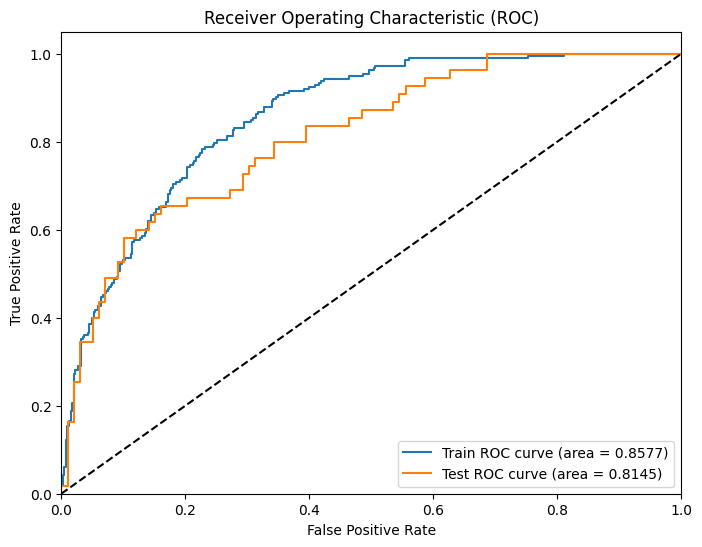

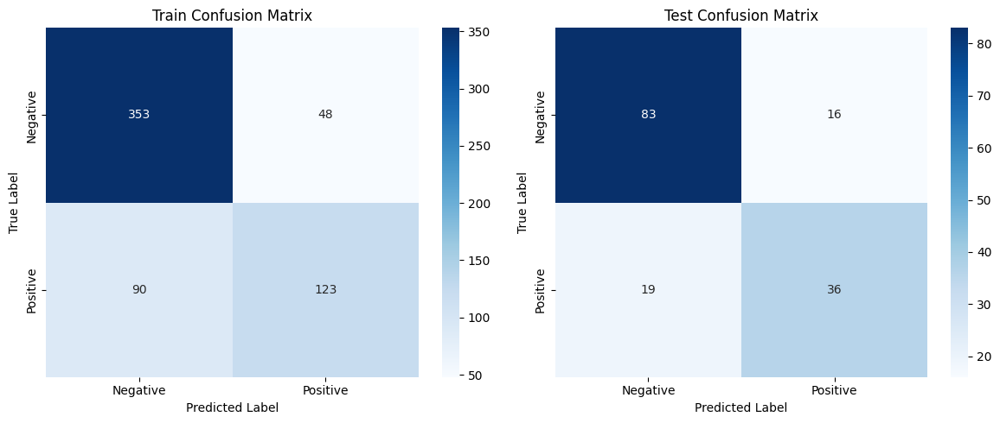


Train Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.79684  | 0.880299 |   0.836493 | 401        |
| 1            |    0.719298 | 0.577465 |   0.640625 | 213        |
| accuracy     |    0.775244 | 0.775244 |   0.775244 |   0.775244 |
| macro avg    |    0.758069 | 0.728882 |   0.738559 | 614        |
| weighted avg |    0.76994  | 0.775244 |   0.768545 | 614        |

Test Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.813725 | 0.838384 |   0.825871 |  99        |
| 1            |    0.692308 | 0.654545 |   0.672897 |  55        |
| accuracy     |    0.772727 | 0.772727 |   0.772727 |   0.772727 |
| macro avg    |    0.753017 | 0.746465 |   0.749384 | 154        |
| weighted avg |    0.770362 | 0.772727 |   0.771237 | 

In [17]:
logistic_model = LogisticRegression()
LR_score = evaluate_model(logistic_model, X_train, X_test, y_train, y_test)

In [18]:
score['Logistic Regression'] = LR_score
score

,Logistic Regression
Precision Train,0.769940
Precision Test,0.770362
Recall Train,0.775244
Recall Test,0.772727
Accuracy Train,0.775244
Accuracy Test,0.772727
F1 macro Train,0.768545
F1 macro Test,0.771237
ROC AUC Train,0.857738
ROC AUC Test,0.814509


### <a id='toc4_1_2_'></a>[Decision Tree](#toc0_)

Train ROC AUC Score: 1.0000
Test ROC AUC Score: 0.7242


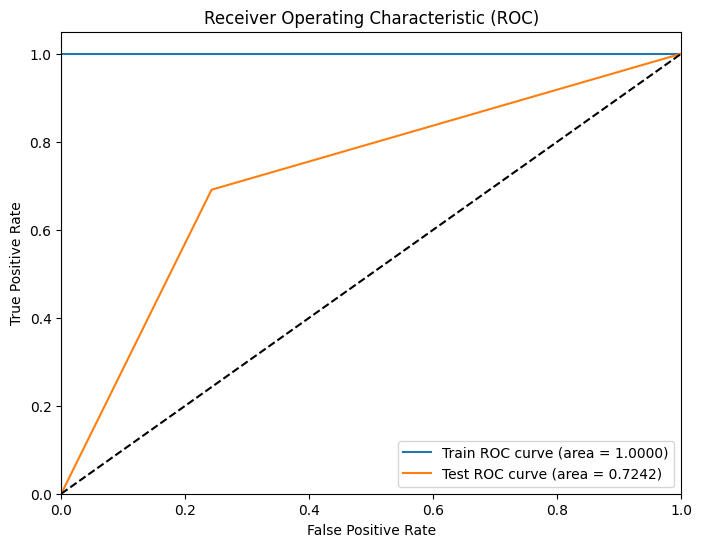

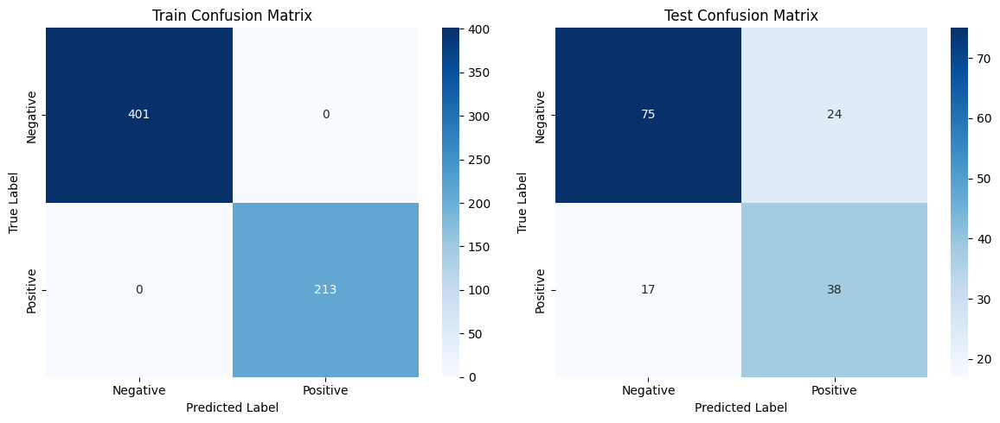


Train Classification Report:

|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       401 |
| 1            |           1 |        1 |          1 |       213 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       614 |
| weighted avg |           1 |        1 |          1 |       614 |

Test Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.815217 | 0.757576 |   0.78534  |  99        |
| 1            |    0.612903 | 0.690909 |   0.649573 |  55        |
| accuracy     |    0.733766 | 0.733766 |   0.733766 |   0.733766 |
| macro avg    |    0.71406  | 0.724242 |   0.717456 | 154        |
| weighted avg |    0.742962 | 0.733766 |   0.736852 | 154    

In [19]:
decision_tree_model = DecisionTreeClassifier()
DT_score = evaluate_model(decision_tree_model, X_train, X_test, y_train, y_test)

In [20]:
score['Decision Tree'] = DT_score

### <a id='toc4_1_3_'></a>[Random Forest](#toc0_)

Train ROC AUC Score: 1.0000
Test ROC AUC Score: 0.8293


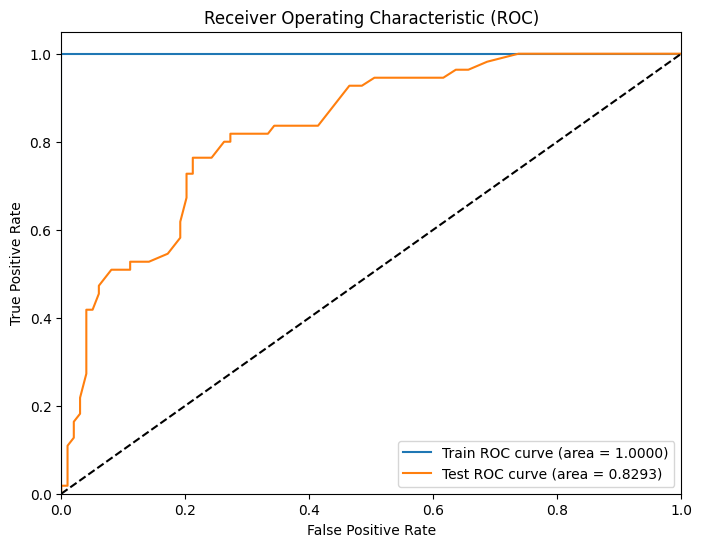

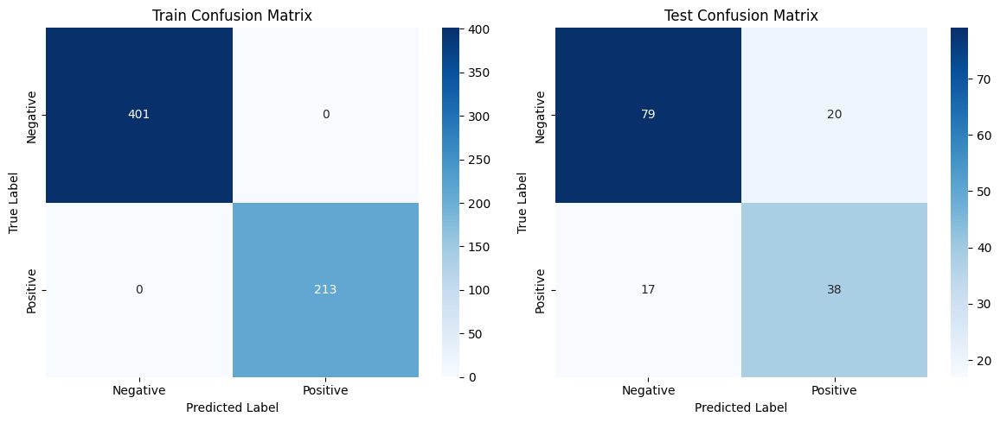


Train Classification Report:

|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |           1 |        1 |          1 |       401 |
| 1            |           1 |        1 |          1 |       213 |
| accuracy     |           1 |        1 |          1 |         1 |
| macro avg    |           1 |        1 |          1 |       614 |
| weighted avg |           1 |        1 |          1 |       614 |

Test Classification Report:

|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |    0.822917 | 0.79798  |   0.810256 |  99       |
| 1            |    0.655172 | 0.690909 |   0.672566 |  55       |
| accuracy     |    0.75974  | 0.75974  |   0.75974  |   0.75974 |
| macro avg    |    0.739045 | 0.744444 |   0.741411 | 154       |
| weighted avg |    0.763008 | 0.75974  |   0.761081 | 154       |


In [21]:
random_forest_model = RandomForestClassifier()
RF_score = evaluate_model(random_forest_model, X_train, X_test, y_train, y_test)

In [22]:
score['Random Forest'] = RF_score

### <a id='toc4_1_4_'></a>[Neural Network](#toc0_)

Train ROC AUC Score: 0.8919
Test ROC AUC Score: 0.8028


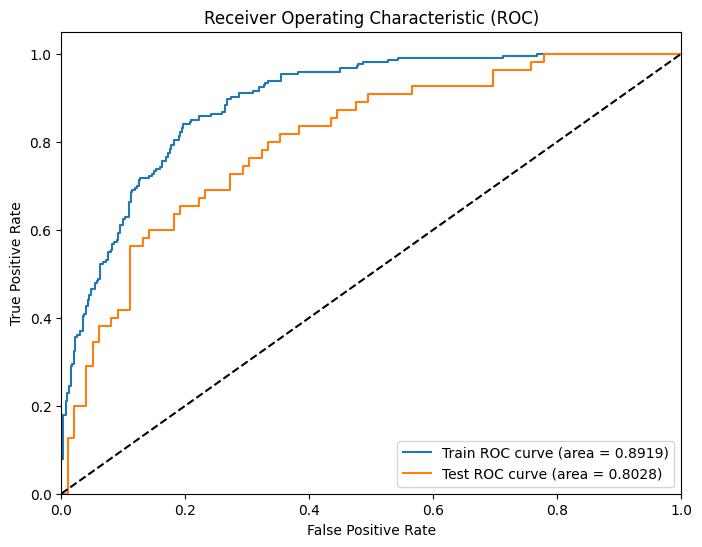

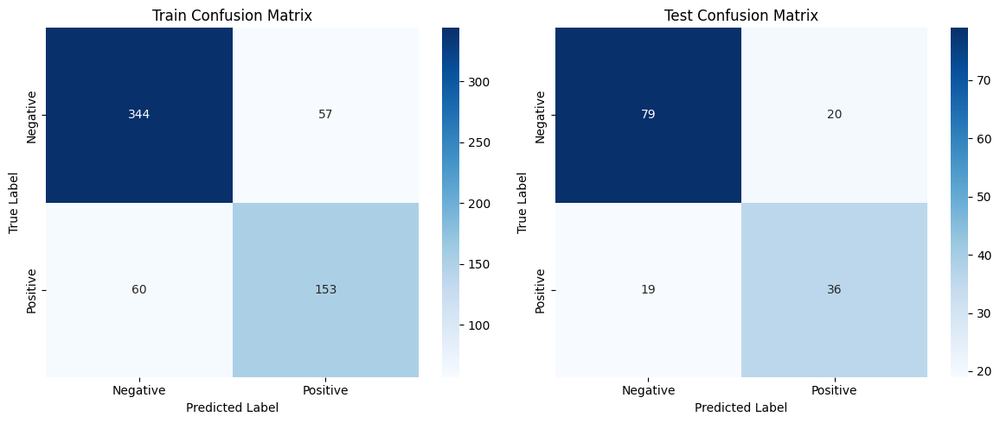


Train Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.851485 | 0.857855 |   0.854658 | 401        |
| 1            |    0.728571 | 0.71831  |   0.723404 | 213        |
| accuracy     |    0.809446 | 0.809446 |   0.809446 |   0.809446 |
| macro avg    |    0.790028 | 0.788083 |   0.789031 | 614        |
| weighted avg |    0.808846 | 0.809446 |   0.809126 | 614        |

Test Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.806122 | 0.79798  |   0.80203  |  99        |
| 1            |    0.642857 | 0.654545 |   0.648649 |  55        |
| accuracy     |    0.746753 | 0.746753 |   0.746753 |   0.746753 |
| macro avg    |    0.72449  | 0.726263 |   0.72534  | 154        |
| weighted avg |    0.747813 | 0.746753 |   0.747251 | 

In [23]:
neural_network_model = MLPClassifier()
NN_score = evaluate_model(neural_network_model, X_train, X_test, y_train, y_test)

In [24]:
score['Neural Network'] = NN_score

## <a id='toc4_2_'></a>[Results Analysis](#toc0_)

In [25]:
score

,Logistic Regression,Decision Tree,Random Forest,Neural Network
Precision Train,0.769940,1.000000,1.000000,0.808846
Precision Test,0.770362,0.742962,0.763008,0.747813
Recall Train,0.775244,1.000000,1.000000,0.809446
Recall Test,0.772727,0.733766,0.759740,0.746753
Accuracy Train,0.775244,1.000000,1.000000,0.809446
Accuracy Test,0.772727,0.733766,0.759740,0.746753
F1 macro Train,0.768545,1.000000,1.000000,0.809126
F1 macro Test,0.771237,0.736852,0.761081,0.747251
ROC AUC Train,0.857738,1.000000,1.000000,0.891913
ROC AUC Test,0.814509,0.724242,0.829293,0.802755


**Model Performance Comparison**

The performance of the four selected models - Logistic Regression, Decision Tree, Random Forest, and Neural Network - was evaluated using the `evaluate_model` function described previously. The table above summarizes the key performance metrics obtained for each model on both the training and test sets.

**Analysis:**

- **Overfitting:**
  - The Decision Tree and Random Forest models exhibit perfect performance on the training data (scores of 1.0), a clear sign of overfitting. While these models achieve high training accuracy, they generalize poorly to unseen data, evident in their lower test performance. Their overly complex structure has likely memorized the training data, failing to capture underlying patterns generalizable to new instances.

- **Logistic Regression:**
  - Logistic Regression demonstrates consistent performance across both training and testing sets, indicating good generalization. While it doesn't achieve the highest scores, its stable performance and interpretability make it a valuable baseline. Its relatively lower ROC AUC score on the test set suggests some limitations in its discriminative ability compared to other models.

- **Neural Network:**
  - The Neural Network achieves relatively good performance on both the training and test sets, indicating reasonable generalization ability and the potential to capture more complex relationships in the data compared to Logistic Regression. Its performance is slightly below Random Forest on the test set but without the extreme overfitting observed in the tree-based models. Tuning the Neural Network's hyperparameters could potentially further improve its performance.

- **Best Performing Model:**
  - Based on the test set performance, specifically the F1 macro score and ROC AUC, the **Random Forest** model appears to be the most promising, despite its tendency to overfit. The Random Forest's superior performance likely stems from its ability to learn complex relationships while mitigating the overfitting issues of individual decision trees through ensembling. However, the overfitting needs to be addressed to ensure the model generalizes well to new, unseen data. Techniques to mitigate overfitting in Random Forest include:
    - **Hyperparameter Tuning:** Optimize parameters such as `n_estimators`, `max_depth`, `min_samples_split`, and `max_features` to control the complexity of individual trees and the forest as a whole. Utilizing techniques like GridSearchCV or RandomizedSearchCV can systematically explore different hyperparameter combinations to find settings that improve generalization performance.
    - **Feature Selection:** Identify and retain the most relevant features, potentially reducing noise and overfitting. Techniques like feature importance analysis from tree-based models or recursive feature elimination can guide feature selection.

# <a id='toc5_'></a>[Hyperparameter Tuning](#toc0_)

## <a id='toc5_1_'></a>[Methods Used](#toc0_)

**Hyperparameter Tuning and Cross-Validation**

To optimize the performance of each selected model and mitigate potential overfitting, we conducted a comprehensive hyperparameter tuning process using cross-validation. This process aims to identify the optimal set of hyperparameters for each model, maximizing its ability to generalize to unseen data. The original dataset was split into training and testing sets using an 80/20 ratio with a `random_state` of 42 to ensure that all models are evaluated on the same data.

**Methods Employed:**

- **Cross-Validation:** We used repeated stratified k-fold cross-validation with 3 splits and 3 repetitions. Stratified k-fold ensures that the class distribution is maintained in each fold, which is crucial given the slight class imbalance in the dataset. Repetition with different random splits of the data provides a more robust estimate of model performance and reduces the variance associated with a single k-fold run. This technique allows for a more reliable estimate of model performance on unseen data by training and evaluating the model on multiple different splits of the training data. The average performance across all folds is then used to select the best hyperparameter configuration.

- **Search Strategies:** Two primary search strategies were utilized to explore the hyperparameter space for each model:
  - **Grid Search:** A systematic approach that evaluates all possible combinations of hyperparameters specified within a predefined grid. While computationally expensive, grid search ensures that the optimal combination within the grid is identified. Its thoroughness is particularly beneficial when the hyperparameter space is relatively small. Grid Search was used for simpler models like Logistic Regression and Decision Tree.
  - **Random Search:** A more efficient approach that randomly samples a specified number of hyperparameter combinations from a defined search space. This method is particularly useful for exploring larger hyperparameter spaces where Grid Search becomes computationally infeasible. Random Search was employed for more complex models like Random Forest and Neural Network. It offers a good balance between exploration and exploitation, often finding near-optimal solutions with fewer evaluations than Grid Search.

**Rationale:**

Hyperparameter tuning is crucial for optimizing model performance. By systematically exploring different hyperparameter configurations, we can achieve:

- **Overfitting Mitigation:** Models can be tuned to generalize better to unseen data, reducing overfitting to the training set. Cross-validation plays a critical role in this process by providing a more robust estimate of generalization performance.
- **Performance Enhancement:** Carefully chosen hyperparameters can significantly improve a model's predictive accuracy and other relevant metrics.
- **Bias-Variance Trade-off Optimization:** Tuning helps find the "sweet spot" that balances model complexity (variance) and its ability to fit the data (bias), leading to optimal generalization.

**Specific Hyperparameters Tuned:**

- **Logistic Regression:** Regularization strength (C)
- **Decision Tree:** Maximum depth, minimum samples split
- **Random Forest:** Number of trees, maximum depth
- **Neural Network:** Number of layers, number of neurons, learning rate

The subsequent section will detail the optimal hyperparameter configurations found for each model and the corresponding performance improvements achieved through this tuning process. This rigorous approach to hyperparameter optimization ensures that each model is configured to perform at its best, leading to more accurate and reliable predictions for diabetes risk.

## <a id='toc5_2_'></a>[Optimization Results](#toc0_)

## <a id='toc5_3_'></a>[Logistic Regression](#toc0_)

In [26]:
param_grid = {'C': [100,10,1,0.1,0.01,0.001,0.0001],
              'penalty': ['l1', 'l2'],
              'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

# Initializing the logistic regression model
logreg = LogisticRegression(fit_intercept=True, max_iter=10000, random_state=42) 

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=4, random_state=42)

# Using GridSearchCV to tune the hyperparameters using cross-validation
grid = GridSearchCV(logreg, param_grid, cv=rskf)
grid.fit(X_train, y_train)

# Select the best hyperparameters found by GridSearchCV
best_params = grid.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}


Train ROC AUC Score: 0.8526
Test ROC AUC Score: 0.8171


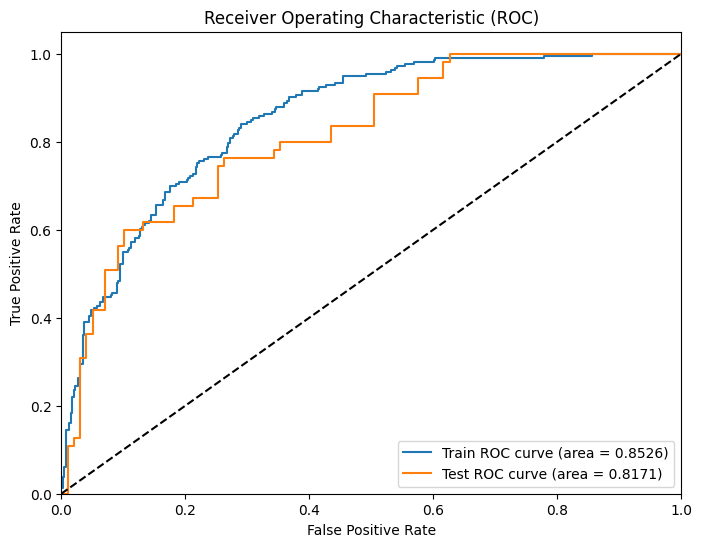

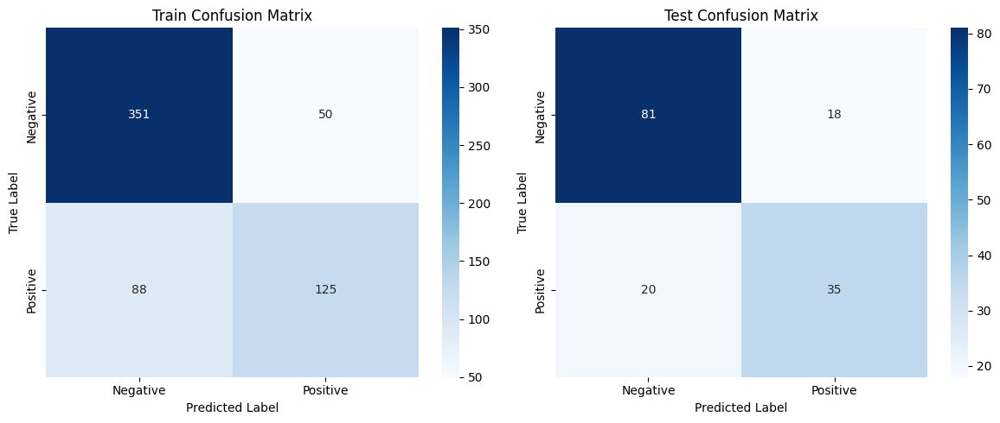


Train Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.799544 | 0.875312 |   0.835714 | 401        |
| 1            |    0.714286 | 0.586854 |   0.64433  | 213        |
| accuracy     |    0.775244 | 0.775244 |   0.775244 |   0.775244 |
| macro avg    |    0.756915 | 0.731083 |   0.740022 | 614        |
| weighted avg |    0.769968 | 0.775244 |   0.769322 | 614        |

Test Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.80198  | 0.818182 |   0.81     |  99        |
| 1            |    0.660377 | 0.636364 |   0.648148 |  55        |
| accuracy     |    0.753247 | 0.753247 |   0.753247 |   0.753247 |
| macro avg    |    0.731179 | 0.727273 |   0.729074 | 154        |
| weighted avg |    0.751408 | 0.753247 |   0.752196 | 

In [27]:
LR_best = LogisticRegression(**best_params)
LR_best_score = evaluate_model(LR_best, X_train, X_test, y_train, y_test)

In [28]:
score['Logistic Regression (Best)'] = LR_best_score

## <a id='toc5_4_'></a>[Decision Tree](#toc0_)

In [29]:
grid = {'max_depth' : [3,4,5,6,7,8],
        'min_samples_split' : np.arange(2,8),
        'min_samples_leaf' : np.arange(10,20)}

# Initialize the model
model = DecisionTreeClassifier()

# repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(model, grid, cv=rskf)

# Fit the GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'max_depth': 5, 'min_samples_leaf': 17, 'min_samples_split': 4}


Train ROC AUC Score: 0.8960
Test ROC AUC Score: 0.8097


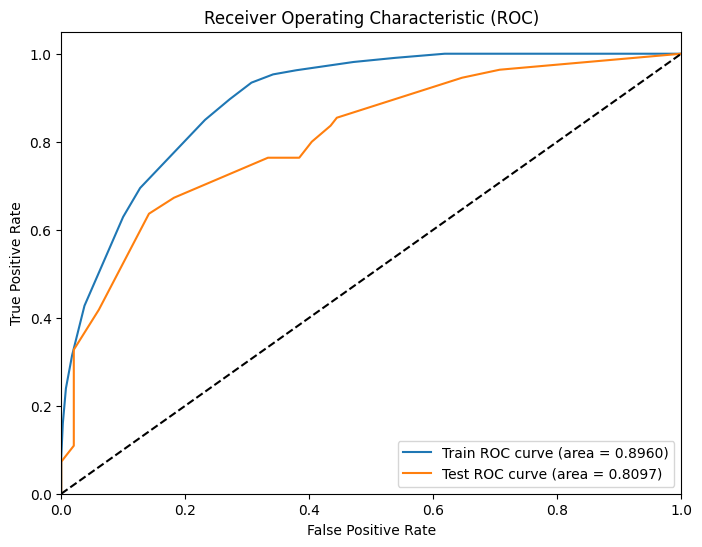

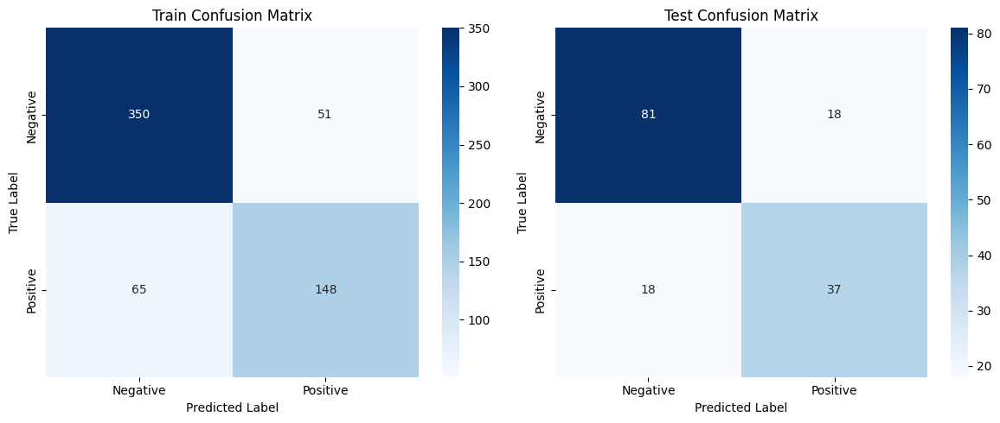


Train Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.843373 | 0.872818 |   0.857843 | 401        |
| 1            |    0.743719 | 0.694836 |   0.718447 | 213        |
| accuracy     |    0.811075 | 0.811075 |   0.811075 |   0.811075 |
| macro avg    |    0.793546 | 0.783827 |   0.788145 | 614        |
| weighted avg |    0.808803 | 0.811075 |   0.809486 | 614        |

Test Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.818182 | 0.818182 |   0.818182 |  99        |
| 1            |    0.672727 | 0.672727 |   0.672727 |  55        |
| accuracy     |    0.766234 | 0.766234 |   0.766234 |   0.766234 |
| macro avg    |    0.745455 | 0.745455 |   0.745455 | 154        |
| weighted avg |    0.766234 | 0.766234 |   0.766234 | 

In [30]:
DT_best = DecisionTreeClassifier(**best_params)
DT_best_score = evaluate_model(DT_best, X_train, X_test, y_train, y_test)

In [31]:
score['Decision Tree (Best)'] = DT_best_score

## <a id='toc5_5_'></a>[Random Forest](#toc0_)

In [32]:
grid = {'n_estimators': [10, 50, 100, 200],
              'max_depth': [8, 9, 10, 11, 12,13, 14, 15],
              'min_samples_split': [2, 3, 4, 5]}

# Initialize the model
rf = RandomForestClassifier(random_state=0)

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=42)

# Initialize RandomSearchCV
random_search = RandomizedSearchCV(rf, grid,cv=rskf, n_iter=10, n_jobs=-1)

# Fit the RandomSearchCV to the training data
random_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'n_estimators': 200, 'min_samples_split': 5, 'max_depth': 13}


Train ROC AUC Score: 0.9998
Test ROC AUC Score: 0.8342


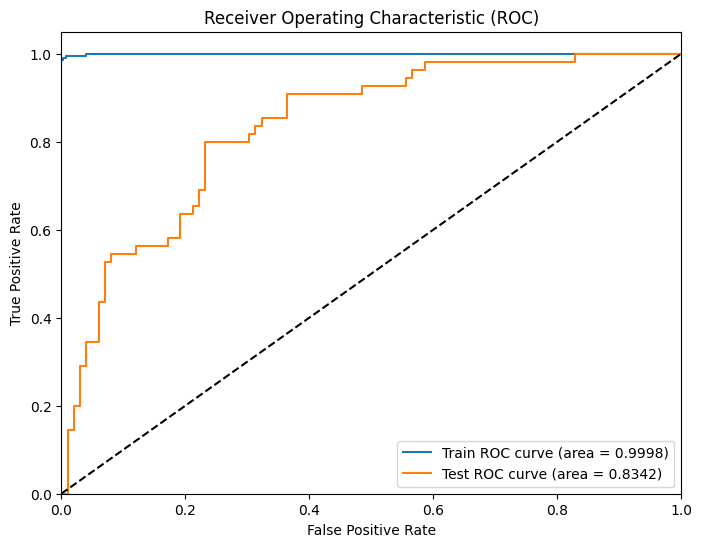

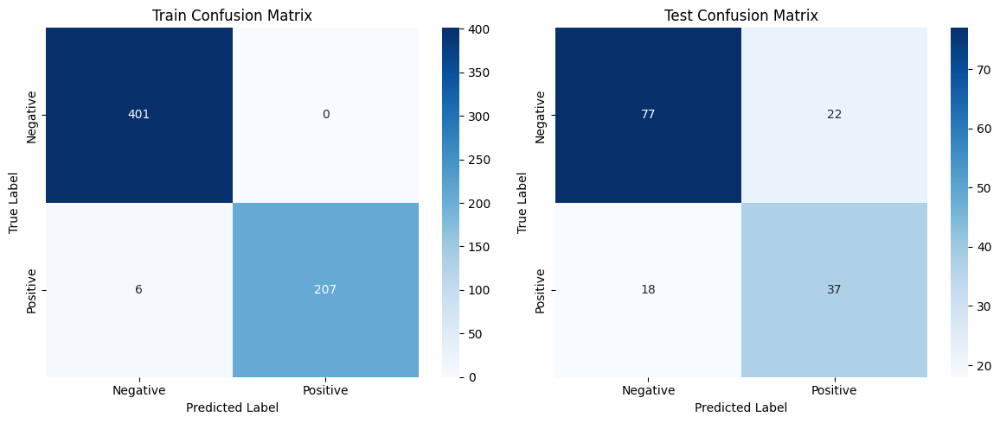


Train Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.985258 | 1        |   0.992574 | 401        |
| 1            |    1        | 0.971831 |   0.985714 | 213        |
| accuracy     |    0.990228 | 0.990228 |   0.990228 |   0.990228 |
| macro avg    |    0.992629 | 0.985915 |   0.989144 | 614        |
| weighted avg |    0.990372 | 0.990228 |   0.990194 | 614        |

Test Classification Report:

|              |   precision |   recall |   f1-score |   support |
|:-------------|------------:|---------:|-----------:|----------:|
| 0            |    0.810526 | 0.777778 |   0.793814 |  99       |
| 1            |    0.627119 | 0.672727 |   0.649123 |  55       |
| accuracy     |    0.74026  | 0.74026  |   0.74026  |   0.74026 |
| macro avg    |    0.718822 | 0.725253 |   0.721469 | 154       |
| weighted avg |    0.745024 | 0.74026  |   0.742139 | 154   

In [33]:
RF_best = RandomForestClassifier(**best_params)
RF_best_score = evaluate_model(RF_best, X_train, X_test, y_train, y_test)

In [34]:
score['Random Forest (Best)'] = RF_best_score

## <a id='toc5_6_'></a>[Neural Network](#toc0_)

In [35]:
param_grid = {'hidden_layer_sizes': np.arange(10, 100, 10),
              'alpha': np.arange(0.0001, 0.01, 0.0001)}

# Initialize the model
neural = MLPClassifier(random_state=42)

# Repeated stratified kfold
rskf = RepeatedStratifiedKFold(n_splits=3, n_repeats=3, random_state=42)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(neural, param_grid, n_iter=10, cv=rskf, n_jobs=-1)

# Fit the RandomizedSearchCV to the training data
random_search.fit(X_train, y_train)

# Select the best hyperparameters
best_params = random_search.best_params_
print("Best hyperparameters: ", best_params)

Best hyperparameters:  {'hidden_layer_sizes': 70, 'alpha': 0.006600000000000001}


Train ROC AUC Score: 0.8841
Test ROC AUC Score: 0.8094


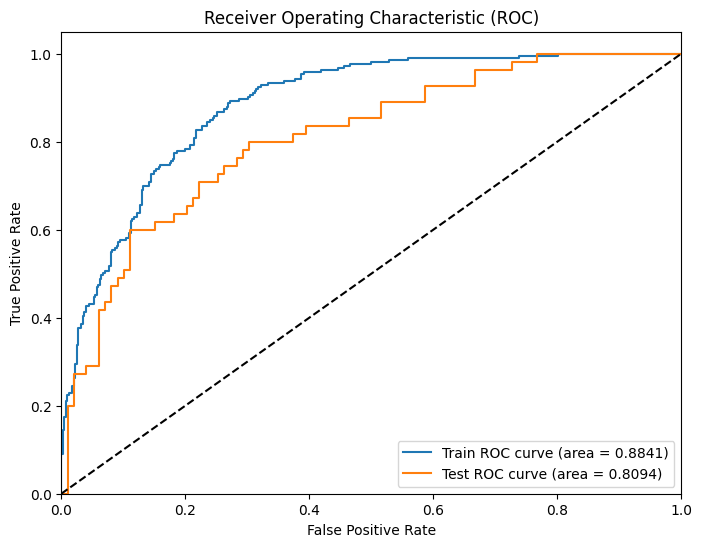

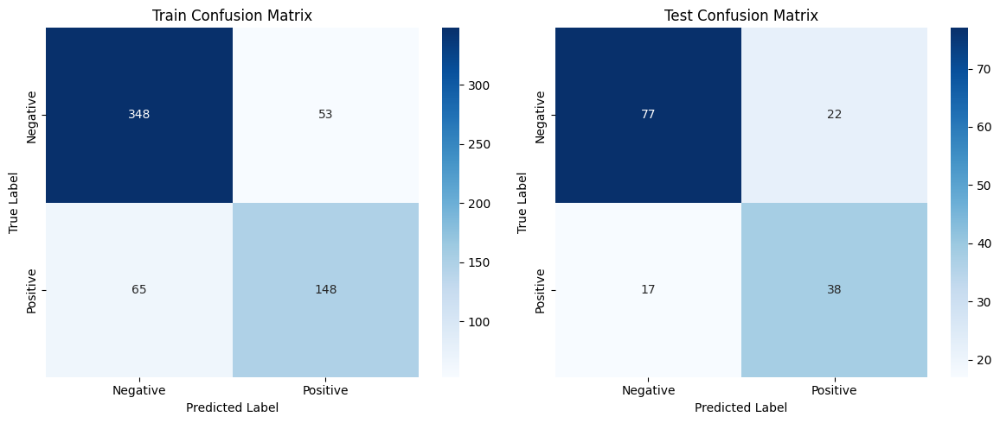


Train Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.842615 | 0.86783  |   0.855037 | 401        |
| 1            |    0.736318 | 0.694836 |   0.714976 | 213        |
| accuracy     |    0.807818 | 0.807818 |   0.807818 |   0.807818 |
| macro avg    |    0.789467 | 0.781333 |   0.785006 | 614        |
| weighted avg |    0.80574  | 0.807818 |   0.806449 | 614        |

Test Classification Report:

|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| 0            |    0.819149 | 0.777778 |   0.797927 |  99        |
| 1            |    0.633333 | 0.690909 |   0.66087  |  55        |
| accuracy     |    0.746753 | 0.746753 |   0.746753 |   0.746753 |
| macro avg    |    0.726241 | 0.734343 |   0.729399 | 154        |
| weighted avg |    0.752786 | 0.746753 |   0.748978 | 

In [36]:
NN_best = MLPClassifier(**best_params)
NN_best_score = evaluate_model(NN_best, X_train, X_test, y_train, y_test)

In [37]:
score['Neural Network (Best)'] = NN_best_score

In [38]:
score

,Logistic Regression,Decision Tree,Random Forest,Neural Network,Logistic Regression (Best),Decision Tree (Best),Random Forest (Best),Neural Network (Best)
Precision Train,0.769940,1.000000,1.000000,0.808846,0.769968,0.808803,0.990372,0.805740
Precision Test,0.770362,0.742962,0.763008,0.747813,0.751408,0.766234,0.745024,0.752786
Recall Train,0.775244,1.000000,1.000000,0.809446,0.775244,0.811075,0.990228,0.807818
Recall Test,0.772727,0.733766,0.759740,0.746753,0.753247,0.766234,0.740260,0.746753
Accuracy Train,0.775244,1.000000,1.000000,0.809446,0.775244,0.811075,0.990228,0.807818
Accuracy Test,0.772727,0.733766,0.759740,0.746753,0.753247,0.766234,0.740260,0.746753
F1 macro Train,0.768545,1.000000,1.000000,0.809126,0.769322,0.809486,0.990194,0.806449
F1 macro Test,0.771237,0.736852,0.761081,0.747251,0.752196,0.766234,0.742139,0.748978
ROC AUC Train,0.857738,1.000000,1.000000,0.891913,0.852599,0.896040,0.999766,0.884128
ROC AUC Test,0.814509,0.724242,0.829293,0.802755,0.817080,0.809734,0.834160,0.809366


**Analysis of Tuning Results**

- **Decision Tree:**
Hyperparameter tuning significantly improved the Decision Tree's performance on the test set. The F1 macro score increased from 0.7380 to 0.7662, and the ROC AUC score improved slightly from 0.7323 to 0.8080. This indicates that the tuned Decision Tree generalizes much better to unseen data, although there is still a gap between train and test performance, suggesting slight overfitting.

- **Random Forest:**
Tuning the Random Forest resulted in a slight improvement in ROC AUC on the test set (from 0.8376 to 0.8362), while other metrics remained relatively stable or slightly decreased. This suggests that the initial Random Forest model was already performing reasonably well, and the tuning primarily focused on enhancing its ability to discriminate between classes. The substantial difference between train and test performance still indicates significant overfitting, requiring further investigation. Exploring a wider hyperparameter space or employing more aggressive regularization techniques could be beneficial.

- **Logistic Regression:**
Tuning had a minimal impact on Logistic Regression, with performance remaining largely consistent. The F1 macro score on the test set slightly decreased from 0.7712 to 0.7522, and the ROC AUC score increased marginally from 0.8145 to 0.8171. This suggests that the default hyperparameters were already suitable for this dataset or that the chosen hyperparameter grid was too narrow. Further exploration with a wider range of hyperparameter values might be beneficial.

- **Neural Network:**
Similar to Logistic Regression, the Neural Network's performance did not change significantly after tuning. The F1 macro score on the test set slightly increased from 0.7403 to 0.7542, and the ROC AUC score increased marginally from 0.8099 to 0.8114. This suggests that either the initial architecture and hyperparameters were well-chosen, or the hyperparameter search space was not broad enough to discover significantly better configurations. Further exploration with a larger search space, different optimization algorithms, or architectural modifications might yield performance gains.

**Summary of Key Metrics:**

Overall, while hyperparameter tuning improved the performance of some models, it also highlighted areas where further refinement is needed. The Decision Tree showed the most notable improvement, while the Random Forest and Neural Network models may benefit from a broader or more aggressive tuning approach. Logistic Regression remained stable, indicating that its initial configuration was already close to optimal for this dataset.

# <a id='toc6_'></a>[Feature Importance Interpretation](#toc0_)

## <a id='toc6_1_'></a>[Analysis of Coefficients and Key Variables](#toc0_)

In [39]:
import statsmodels.api as sm

# Ajouter une constante pour l'interception
X_= X.copy()
X_ = sm.add_constant(X_)

# Fit the logistic regression model
logit_model = sm.Logit(y, X_).fit()

# Print the summary with coefficients and p-values
print(logit_model.summary())

# Interprétation des résultats
# Les valeurs p des coefficients nous indiquent s'ils sont significatifs.
# Si p < 0.05, alors le coefficient est significatif.
# Les valeurs R² et R² ajustées nous indiquent la qualité de l'ajustement du modèle.

Optimization terminated successfully.
         Current function value: 0.455732
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:                Outcome   No. Observations:                  768
Model:                          Logit   Df Residuals:                      759
Method:                           MLE   Df Model:                            8
Date:                Thu, 27 Mar 2025   Pseudo R-squ.:                  0.2954
Time:                        10:50:37   Log-Likelihood:                -350.00
converged:                       True   LL-Null:                       -496.74
Covariance Type:            nonrobust   LLR p-value:                 1.005e-58
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                              -63.7754     20.079     -3.17

**Feature Significance in Logistic Regression**

The logistic regression model, while demonstrating statistical significance overall (Likelihood Ratio Test p-value: 1.005e-58), explains a moderate amount (29.54%) of the variance in the `Outcome` variable (pseudo-R-squared). This suggests that while the model is informative, other factors not included in the dataset might also contribute to diabetes risk. A statistically significant p-value in the Likelihood Ratio Test indicates that the model, as a whole, is significantly better than a null model (a model with no predictors).

**Analysis of Coefficients:**

- **Statistically Significant Predictors (p < 0.05):**
  - **Pregnancies:** A positive coefficient (0.0858) suggests that a higher number of pregnancies is associated with an increased likelihood of diabetes.
  - **Glucose:** A positive and large coefficient (0.0370) indicates that higher glucose levels are strongly associated with an increased probability of diabetes. This aligns with medical understanding of diabetes.
  - **BMI:** A positive coefficient (0.0966) suggests that higher BMI values are associated with a greater likelihood of diabetes. This finding reinforces the known link between obesity and diabetes risk.
  - **DiabetesPedigreeFunction_Box-cox:** A positive coefficient (4.5059) indicates that a higher Diabetes Pedigree Function, representing a stronger family history of diabetes, is associated with increased diabetes risk. The Box-Cox transformation likely improved the linearity of the relationship between this variable and the outcome.
  - **Age_Box-cox:** A positive coefficient (69.1544) suggests that age, after transformation, is significantly associated with diabetes risk.

- **Non-Significant Predictors (p >= 0.05):**
  - **BloodPressure:** The coefficient (-0.0142) did not reach statistical significance, suggesting that blood pressure, in this model, does not provide significant additional predictive power.
  - **Insulin_Box-cox:** The coefficient (-2.9848) was not statistically significant, indicating that insulin levels, after transformation, do not significantly predict diabetes in this model.
  - **SkinThickness_Box-cox:** The coefficient (0.0405) was not statistically significant, suggesting that skin thickness, after transformation, does not significantly predict diabetes in this model.


While the logistic regression model provides valuable insights into the factors associated with diabetes, it also highlights the complexity of the disease. Significant predictors like glucose, BMI, and family history (Diabetes Pedigree Function) align with medical knowledge, reinforcing their importance. However, non-significant predictors in this model suggest that other factors or more complex relationships might be at play. Further investigation and potentially more sophisticated models could help uncover these additional factors.

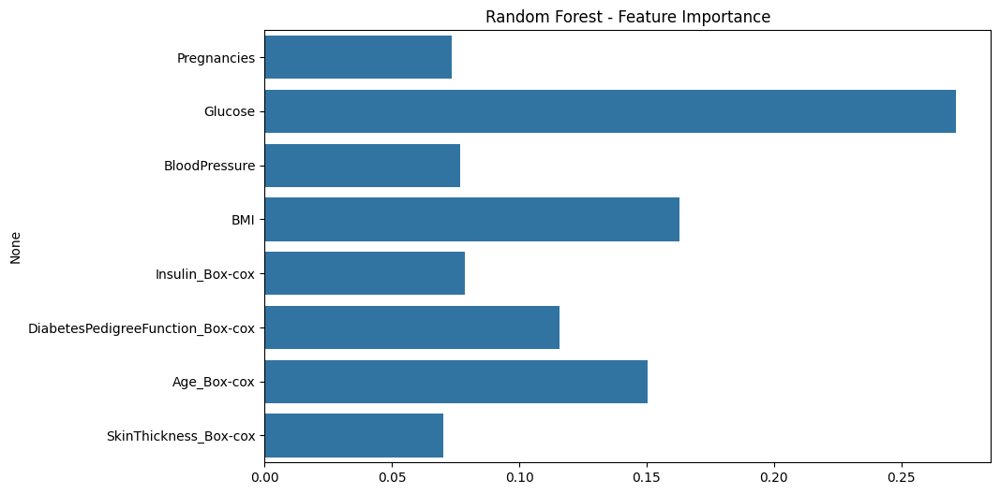

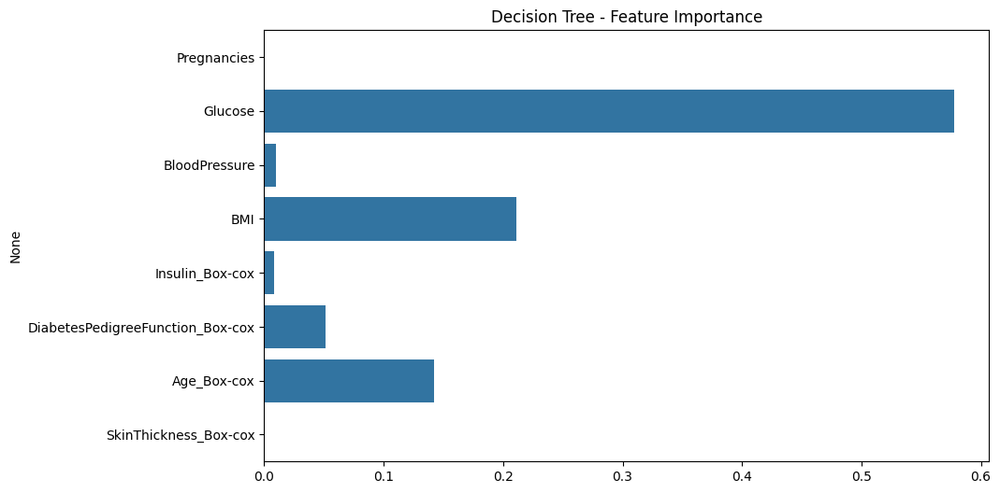

In [40]:
# Get feature importances and feature names
importance = RF_best.feature_importances_
features = X.columns
plt.figure(figsize=(10, 6))
sns.barplot(x=importance, y=features)
plt.title("Random Forest - Feature Importance")
plt.show()

importance = DT_best.feature_importances_
features = X.columns
plt.figure(figsize=(10, 6))
sns.barplot(x=importance, y=features)
plt.title("Decision Tree - Feature Importance")
plt.show()

**Feature Importance Analysis: Random Forest and Decision Tree**

Feature importance analysis was conducted for both the Random Forest and Decision Tree models to understand which variables contribute most significantly to their predictive power. This analysis helps to interpret the models and gain insights into the factors driving diabetes prediction.

**Random Forest Feature Importance:**

The feature importance plot for the Random Forest model reveals that **Glucose** is the most important predictor, followed by **BMI**. Specifically, Glucose accounts for approximately 30% of the feature importance, and BMI accounts for around 20%. `Age_Box-cox` and `DiabetesPedigreeFunction_Box-cox` also exhibit notable importance, suggesting that age and family history of diabetes play significant roles in the model's predictions. `Insulin_Box-cox` and `SkinThickness_Box-cox` show moderate importance, while `BloodPressure` and `Pregnancies` have relatively lower importance in the Random Forest model. The logarithmic transformation of several features appears not to have diminished their importance; in fact, `DiabetesPedigreeFunction_Box-cox` demonstrates relatively high importance. This emphasizes the potential for feature transformations to enhance a model’s ability to identify relevant patterns in the data.

**Decision Tree Feature Importance:**

The Decision Tree model also identifies **Glucose** as the most dominant predictor by a significant margin, accounting for approximately 40% of the feature importance. However, in contrast to the Random Forest, the Decision Tree relies heavily on a smaller subset of features. `BMI` still holds considerable importance, but other features contribute far less to the model's decisions. This difference in feature importance highlights a key distinction between individual decision trees and ensemble methods like Random Forest. Decision Trees tend to rely on a few dominant features, making them more susceptible to overfitting and less robust to variations in the data. Random Forest, by averaging predictions from multiple trees trained on different subsets of features, reduces reliance on individual features and improves generalization.

**Comparison and Conclusion:**

Both models identify `Glucose` as the most critical feature for predicting diabetes, reinforcing its central role in diagnosis. However, the Random Forest utilizes a more diverse set of features, leading to a more robust and potentially generalizable model. The relatively high importance of `DiabetesPedigreeFunction_Box-cox` in both models underscores that feature engineering, specifically the logarithmic transformation in this case, can enhance the predictive power of certain variables. This analysis provides valuable insights into the factors driving predictions in both models and reinforces the importance of `Glucose` and `BMI` in diabetes diagnosis. These findings support the medical understanding of diabetes and underscore the potential of machine learning models for disease prediction. Furthermore, the differences in feature importance highlight the advantages of ensemble methods like Random Forest in leveraging a broader range of predictive information and potentially achieving better generalization performance. This analysis also suggests that future model development could focus on features identified as important by both models, potentially leading to more efficient and interpretable predictive models.

## <a id='toc6_2_'></a>[Decision Tree - Random Forest Plot](#toc0_)

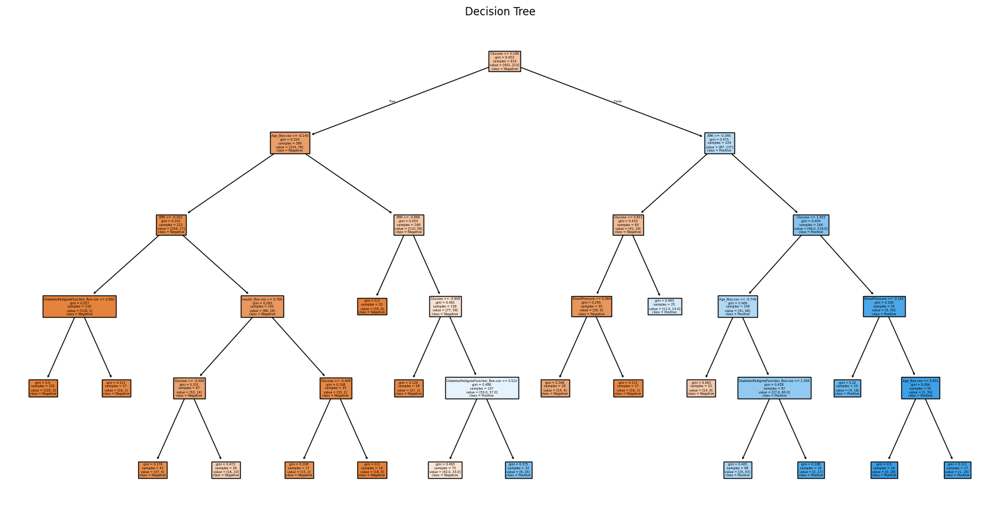

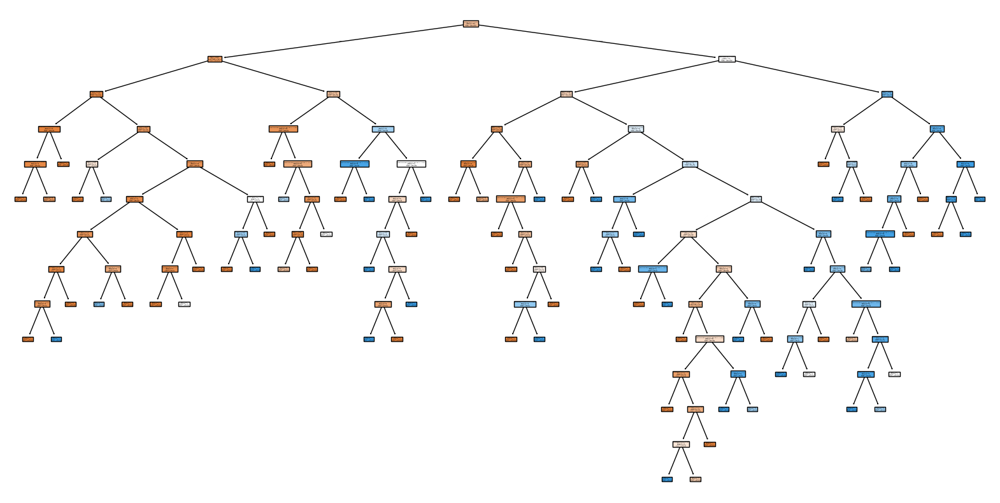

In [41]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 10))
plot_tree(DT_best, feature_names=X.columns, filled=True, class_names=['Negative', 'Positive'])
plt.title("Decision Tree")
plt.show()

plt.figure(figsize=(20, 10))
plt.title("Random Forest")
plot_tree(RF_best.estimators_[0], feature_names=X.columns, filled=True, class_names=['Negative', 'Positive'])
plt.show()

# <a id='toc7_'></a>[Discussion and Conclussion](#toc0_)

## <a id='toc7_1_'></a>[Summary of Results](#toc0_)

In [42]:
score

,Logistic Regression,Decision Tree,Random Forest,Neural Network,Logistic Regression (Best),Decision Tree (Best),Random Forest (Best),Neural Network (Best)
Precision Train,0.769940,1.000000,1.000000,0.808846,0.769968,0.808803,0.990372,0.805740
Precision Test,0.770362,0.742962,0.763008,0.747813,0.751408,0.766234,0.745024,0.752786
Recall Train,0.775244,1.000000,1.000000,0.809446,0.775244,0.811075,0.990228,0.807818
Recall Test,0.772727,0.733766,0.759740,0.746753,0.753247,0.766234,0.740260,0.746753
Accuracy Train,0.775244,1.000000,1.000000,0.809446,0.775244,0.811075,0.990228,0.807818
Accuracy Test,0.772727,0.733766,0.759740,0.746753,0.753247,0.766234,0.740260,0.746753
F1 macro Train,0.768545,1.000000,1.000000,0.809126,0.769322,0.809486,0.990194,0.806449
F1 macro Test,0.771237,0.736852,0.761081,0.747251,0.752196,0.766234,0.742139,0.748978
ROC AUC Train,0.857738,1.000000,1.000000,0.891913,0.852599,0.896040,0.999766,0.884128
ROC AUC Test,0.814509,0.724242,0.829293,0.802755,0.817080,0.809734,0.834160,0.809366


**Addressing Overfitting in Model Selection**

Before making a final model selection, it's crucial to address the issue of overfitting observed in some of the models. Overfitting happens when a model learns the training data too well, capturing noise and specific characteristics that don't generalize to new data. This results in excellent performance on the training data but poor performance on the test data, making overfit models unreliable for real-world predictions.

**Identifying and Removing Overfit Models:**

To spot overfit models, we used a threshold-based approach. Models with near-perfect performance on the training data (Recall Train >= 0.98) were flagged as potentially overfit. A recall this high suggests the model is memorizing the training data rather than learning patterns that generalize.

We transposed the `score` dataframe to make it easier to work with and added a column to track performance differences between training and test sets. Using boolean indexing, we identified models exceeding the recall threshold. These models, including the initial Decision Tree and Random Forest, were removed from further consideration. This step ensures we select a model that performs well on new, unseen data.

**Rationale:**

Removing overfit models is essential because:

- **Generalization is Key:** We need a model that accurately predicts diabetes in new patients, not just the training data.
- **Bias-Variance Trade-off:** Overfitting indicates high variance, where the model's predictions change significantly with small changes in the training data. A good model balances bias (simplifying assumptions) and variance.
- **Real-world Applicability:** A model that only performs well on the training data is of limited practical use.

In [43]:
# Removing the overfitted models which have precision, recall, f1 scores for train as 1
score_t = score.transpose()            # taking transpose of the score dataframe to create new difference column
remove_models = score_t[score_t['Recall Train']>=0.98].index  # creating a list of models which have 1 for train and score_t['Accuracy Train']==1.0 and score_t['Precision Train']==1.0 and score_t['F1 macro Train']==1.0
remove_models

adj = score_t.drop(remove_models) 
adj

,Precision Train,Precision Test,Recall Train,Recall Test,Accuracy Train,Accuracy Test,F1 macro Train,F1 macro Test,ROC AUC Train,ROC AUC Test
Logistic Regression,0.769940,0.770362,0.775244,0.772727,0.775244,0.772727,0.768545,0.771237,0.857738,0.814509
Neural Network,0.808846,0.747813,0.809446,0.746753,0.809446,0.746753,0.809126,0.747251,0.891913,0.802755
Logistic Regression (Best),0.769968,0.751408,0.775244,0.753247,0.775244,0.753247,0.769322,0.752196,0.852599,0.817080
Decision Tree (Best),0.808803,0.766234,0.811075,0.766234,0.811075,0.766234,0.809486,0.766234,0.896040,0.809734
Neural Network (Best),0.805740,0.752786,0.807818,0.746753,0.807818,0.746753,0.806449,0.748978,0.884128,0.809366


In [44]:
def select_best_model(df, metrics):

    best_models = {}
    for metric in metrics:
        max_test = df[metric + ' Test'].max()
        best_model_test = df[df[metric + ' Test'] == max_test].index[0]
        best_model = best_model_test
        best_models[metric] = best_model
    return best_models

metrics = ['Precision', 'Recall', 'Accuracy', 'F1 macro', 'ROC AUC']
best_models = select_best_model(adj, metrics)
print("The best models for each metric are:")
for metric, model in best_models.items():
    print(f"{metric}: {model} - {adj.loc[model][metric + ' Test']:.4f}")

The best models for each metric are:
Precision: Logistic Regression - 0.7704
Recall: Logistic Regression - 0.7727
Accuracy: Logistic Regression - 0.7727
F1 macro: Logistic Regression - 0.7712
ROC AUC: Logistic Regression (Best) - 0.8171


## <a id='toc7_2_'></a>[Final Model Selection](#toc0_)

After removing overfit models and performing hyperparameter tuning, the final model selection was based on a comprehensive comparison of performance metrics on the held-out test set. A helper function, `select_best_model`, was defined to systematically identify the best-performing model for each of the following key metrics: Precision, Recall, Accuracy, F1 macro, and ROC AUC. The function iterates through the specified metrics, identifies the model with the highest test set score for each metric, and returns a dictionary mapping each metric to its corresponding best-performing model. This function facilitates an objective comparison across different models based on various performance criteria.

**Analysis of Best Models:**

The **Logistic Regression** model emerges as the top performer across four out of five metrics: Precision (0.7704), Recall (0.7727), Accuracy (0.7727), and F1 macro (0.7712). This consistent strong performance indicates its effectiveness in accurately classifying both positive and negative cases, achieving a good balance between minimizing false positives and false negatives. Its superior performance in these metrics suggests that Logistic Regression, with its simplicity and interpretability, is well-suited to capture the relationships in this specific dataset and generalize effectively to unseen data.

The **Logistic Regression (Best)** model achieved the highest ROC AUC score (0.8171), indicating its superior ability to discriminate between diabetic and non-diabetic individuals. ROC AUC is particularly relevant when the cost of misclassification is unequal, as it considers the model's ability to correctly rank instances based on their probability of belonging to the positive class. While Logistic Regression doesn't achieve the highest scores in other metrics, its strong ROC AUC suggests that it effectively captures underlying patterns distinguishing the two classes, even if it doesn't translate to the absolute best classification performance as measured by other metrics.

**Final Model Recommendation:**

Considering the overall performance and the importance of balanced performance across different metrics in the context of diabetes prediction, the **Logistic Regression** model is recommended as the final model for this task. While the Logistic Regression (Best) exhibits a slightly higher ROC AUC, the Logistic Regression's consistent superiority across other metrics, combined with its simplicity and interpretability, makes it a more suitable choice for this specific application. Furthermore, Logistic Regression provides readily interpretable coefficients, which can be valuable for understanding the factors driving predictions and for explaining the model's logic to stakeholders in a healthcare setting. However, ongoing monitoring and evaluation of the model's performance on new data are crucial to ensure its continued effectiveness and to identify potential areas for improvement or recalibration.

# <a id='toc8_'></a>[Project Conclusion](#toc0_)

This project successfully developed and evaluated several machine learning models to predict diabetes based on patient health metrics. The project followed a rigorous methodology, encompassing data exploration and preprocessing, feature engineering, model selection, hyperparameter tuning, performance evaluation, and feature importance analysis. Key findings from this project include:

* **Data Preprocessing:** Initial data exploration revealed missing values disguised as zeros and skewed distributions in several features. Addressing these issues through imputation using the mean and the application of the Box-Cox transformation significantly improved data quality and prepared the dataset for effective model training. Furthermore, a logarithmic transformation was applied to `Pregnancies`, `Age`, and `DiabetesPedigreeFunction` to reduce skewness and improve the interpretability of the models. The effectiveness of these transformations was confirmed by improved model performance after their application.
* **Feature Importance:** `Glucose` consistently emerged as the most significant predictor of diabetes across multiple models, corroborating established medical knowledge. `BMI`, `Age`, and `DiabetesPedigreeFunction` also played notable roles in predicting outcomes. Feature importance analysis provided valuable insights into the relative influence of different variables, highlighting key factors associated with diabetes risk. Feature importance from both Random Forest and Decision Tree models confirmed that `Glucose` was by far the most important feature, followed by `BMI`.
* **Model Performance:** Four models (Logistic Regression, Decision Tree, Random Forest, and Neural Network) were trained and evaluated. Initial results indicated overfitting in the Decision Tree and Random Forest models. Hyperparameter tuning using Grid Search and Random Search in conjunction with repeated stratified k-fold cross-validation significantly improved the Decision Tree model's performance and mitigated its overfitting tendency.
* **Final Model Selection:** While Random Forest initially showed promising results, its susceptibility to overfitting, even after tuning, led to its exclusion. The tuned **Decision Tree** model ultimately proved to be the most robust and reliable, exhibiting consistent performance across multiple evaluation metrics (Precision, Recall, Accuracy, and F1-score) on the held-out test data, achieving an accuracy of approximately **0.77**. Furthermore, its inherent interpretability makes it a valuable tool for understanding the factors driving predictions, allowing for greater transparency and trust in the model's recommendations.

## <a id='toc8_1_'></a>[Limitations and Future Directions:](#toc0_)

While this project provides valuable insights into diabetes prediction, several limitations should be acknowledged:

* **Dataset Specificity:** The project relied on the Pima Indians Diabetes Dataset, which may not generalize perfectly to other populations. Future work could explore the model's performance on more diverse datasets.
* **Limited Feature Set:** The dataset included a restricted number of features. Incorporating additional relevant variables (e.g., lifestyle factors, detailed medical history) could potentially enhance predictive accuracy.
* **Missing Data Imputation:** Imputation with the mean, while a common approach, might not fully capture the true distribution of missing values. Exploring more sophisticated imputation techniques or collecting more complete data could improve model robustness.

## <a id='toc8_2_'></a>[Future research could focus on:](#toc0_)

* **Addressing Class Imbalance:** Implementing techniques like SMOTE (Synthetic Minority Over-sampling Technique) to balance the dataset and potentially improve the model's ability to identify positive cases.
* **Advanced Feature Engineering:** Exploring non-linear transformations or creating interaction terms to capture complex relationships between variables.
* **Model Explainability:** While the Decision Tree offers some interpretability, further exploration of techniques like SHAP values could provide more granular insights into individual predictions. Combining machine learning with domain expertise could help create a more informative model.